In [1]:
from dask.distributed import Client

client = Client("tcp://127.0.0.1:33919")
client

<Client: 'tcp://127.0.0.1:33919' processes=4 threads=12, memory=31.22 GiB>

In [2]:
# numpy/scipy stuff
import numpy as np

# matplotlib stuff
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.ticker as ticker
import matplotlib.patches as patches
from matplotlib import colors
import matplotlib.gridspec as gridspec
from matplotlib.patches import FancyBboxPatch
import matplotlib as mpl
import matplotlib.lines as mlines
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.lines as mlines
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as mticker

# data sci stuff
import xarray as xr
import pandas as pd
from xarrayutils.plotting import linear_piecewise_scale

# system stuff
import os
import sys
import glob
import fnmatch

# netcdf stuff
from netCDF4 import Dataset
import datetime
import cftime
import nc_time_axis

# dask stuff

from dask.diagnostics import Profiler, ResourceProfiler, CacheProfiler
from dask.diagnostics import visualize

from matplotlib import rcParams

import cartopy.crs as ccrs
import cartopy as cart
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
cartopy.config['data_dir'] = os.getenv('CARTOPY_DIR', cartopy.config.get('data_dir'))

# widgets stuff
import ipywidgets as widgets
from ipywidgets import interact,interactive
from ipywidgets import Checkbox

import os
os.environ['ESMFMKFILE']="/home/guido/miniforge3/lib/esmf.mk"
import xesmf as xe
from xarrayutils.plotting import linear_piecewise_scale


import cmocean as ocm

%matplotlib inline


ERROR 1: PROJ: proj_create_from_database: Open of /home/guido/miniforge3/share/proj failed


In [3]:
def setaxesfsize(axl,fontsize, xlabel, ylabel, labsize):
    ticklabelbot = axl.get_xticklabels()
    ticklabelleft = axl.get_yticklabels()
    for labelx in ticklabelbot:
        labelx.set_fontsize(fontsize)
#    i=0
    for labely in ticklabelleft:
#        if i != 0:
            labely.set_fontsize(fontsize)
    
    axl.set_xlabel(xlabel, size=labsize)
    axl.set_ylabel(ylabel, size=labsize)


In [4]:
# data (climatology) loader 
# e.g. g1850ecoctrl1deg_ANN_051912_056911_climo.nc
gcase_ebm = "g1850ecoctrl1deg"
gcase_noebm = "g1850econoest1deg"
bcase_ebm = "B1850_BPRP_f19_g17_ref"
bcase_noebm = "B1850_BPRP_f19_g17_noest"
basedir = "/mdata/climo/"
month="ANN"
sequence = "051912_056911"
# no need for chuncking time
def climoloader(bdir, case, model, var, seq):
    xrvar = xr.open_dataset(bdir + "/" + case + "/" + model + "/" + case + "_" + month + "_" + seq +"_climo.nc", engine='netcdf4')
    return xrvar[var]


In [5]:
# test load SALT
saltvar = climoloader(basedir, bcase_ebm, "ocn", "SALT", sequence).squeeze()

/home/guido/miniforge3/lib/python3.11/site-packages/gribapi/__init__.py:23: UserWarning: ecCodes 2.31.0 or higher is recommended. You are running version 2.30.0
  warnings.warn(


In [6]:
#saltvar_rg =regridder(saltvar)
#saltvar_rg.attrs = saltvar.attrs
#saltvar_rg.to_dataset(name=saltvar.name).assign_attrs(saltvar.attrs)

In [7]:
aicevar = climoloader(basedir, bcase_ebm, "ice", "aice", sequence).squeeze()

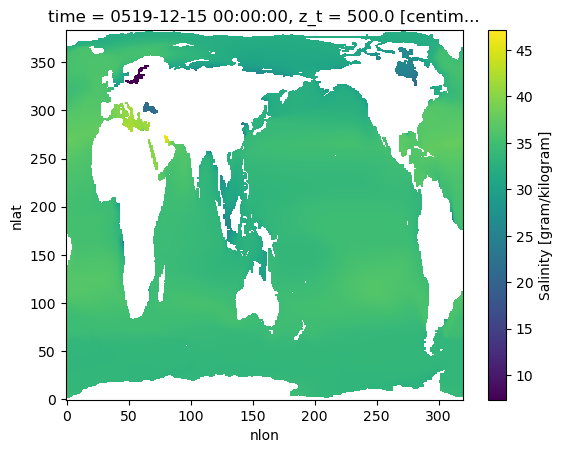

In [8]:
saltvar.isel(z_t=0).plot()

In [9]:
# need to use xesmf to transform the grid
lon = np.linspace(-180.,180.,361)
lat = np.linspace(-90.,90.,181)
# double it for zoom are in amazon
#lon = np.linspace(-180.,180., 721)
#lat = np.linspace(-90.,90.,361)
# regrider
grid_in = {'lon': saltvar['TLONG'], 'lat': saltvar['TLAT']}
grid_out = {'lon': lon, 'lat': lat}
regridder_base = xe.Regridder(grid_in, grid_out, 'nearest_s2d', reuse_weights=False)
def regridder(var):
    var_attrs  = var.attrs
    var_name  = var.name
    #print(var_atts)
    #print(var_name)
    xarr_rg = regridder_base(var).drop_vars("time").assign_attrs(var_attrs)
    xard_rg = xarr_rg.to_dataset(name=var_name)
    return  xard_rg

In [10]:
saltvar = climoloader(basedir, bcase_ebm, "ocn", "SALT", sequence).squeeze()
saltrg = regridder(saltvar)
saltrg

<xarray.Dataset> Size: 16MB
Dimensions:  (z_t: 60, lat: 181, lon: 361)
Coordinates:
  * z_t      (z_t) float32 240B 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
  * lat      (lat) float64 1kB -90.0 -89.0 -88.0 -87.0 ... 87.0 88.0 89.0 90.0
  * lon      (lon) float64 3kB -180.0 -179.0 -178.0 -177.0 ... 178.0 179.0 180.0
Data variables:
    SALT     (z_t, lat, lon) float32 16MB nan nan nan nan ... nan nan nan nan

In [11]:
# need to use xesmf to transform the sea ice grid
ilon = np.linspace(-180.,180.,361)
ilat = np.linspace(-90.,90.,181)
#ilon = np.linspace(-180.,180.,721)
#ilat = np.linspace(-90.,90.,361)
# regrider
igrid_in = {'lon': aicevar['TLON'], 'lat': aicevar['TLAT']}
igrid_out = {'lon': ilon, 'lat': ilat}
iregridder_base = xe.Regridder(igrid_in, igrid_out, 'nearest_s2d', reuse_weights=False)
def iregridder(var):
    var_attrs  = var.attrs
    var_name  = var.name
    #print(var_atts)
    #print(var_name)
    xarr_rg = iregridder_base(var).drop_vars("time").assign_attrs(var_attrs)
    xard_rg = xarr_rg.to_dataset(name=var_name)
    return  xard_rg

In [12]:
# load 50 year averages for all cases
month="ANN"
sequence = "051912_056911"


In [13]:
####### g1850ecoctrl1deg g1850econoebm1deg
basedir = "/mdata/climo/"
gcase_ebm = "g1850ecoctrl1deg"
gcase_noebm = "g1850econoest1deg"

gebm_SALT = regridder(climoloader(basedir, gcase_ebm, "ocn", "SALT", sequence).squeeze())  # for 4-D var
gnoebm_SALT = regridder(climoloader(basedir, gcase_noebm, "ocn", "SALT", sequence).squeeze())
gdiff_SALT = gebm_SALT - gnoebm_SALT 

gebm_SSS = gebm_SALT.isel(z_t = 0).squeeze().drop_vars("z_t")
gnoebm_SSS = gnoebm_SALT.isel(z_t = 0).squeeze().drop_vars("z_t")
gdiff_SSS = gebm_SSS - gnoebm_SSS 

gebm_TEMP = regridder(climoloader(basedir, gcase_ebm, "ocn", "TEMP", sequence).squeeze())  # for 4-D var
gnoebm_TEMP = regridder(climoloader(basedir, gcase_noebm, "ocn", "TEMP", sequence).squeeze())
gdiff_TEMP = gebm_TEMP - gnoebm_TEMP

gebm_SST = gebm_TEMP.isel(z_t = 0).squeeze().drop_vars("z_t")
gnoebm_SST = gnoebm_TEMP.isel(z_t = 0).squeeze().drop_vars("z_t")
gdiff_SST = gebm_SST - gnoebm_SST 

gebm_XBLT = regridder(climoloader(basedir, gcase_ebm, "ocn", "XBLT", sequence).squeeze()) # for 3-D var
gnoebm_XBLT = regridder(climoloader(basedir, gcase_noebm, "ocn", "XBLT", sequence).squeeze())
gdiff_XBLT =  gebm_XBLT - gnoebm_XBLT

gebm_HMXL = regridder(climoloader(basedir, gcase_ebm, "ocn", "HMXL", sequence).squeeze()) # for 3-D var
gnoebm_HMXL = regridder(climoloader(basedir, gcase_noebm, "ocn", "HMXL", sequence).squeeze())
gdiff_HMXL =  gebm_HMXL - gnoebm_HMXL

gebm_SFWF = regridder(climoloader(basedir, gcase_ebm, "ocn", "SFWF", sequence).squeeze()) # for 3-D var
gnoebm_SFWF = regridder(climoloader(basedir, gcase_noebm, "ocn", "SFWF", sequence).squeeze())
gdiff_SFWF =  gebm_SFWF - gnoebm_SFWF

gebm_spChl = regridder(climoloader(basedir, gcase_ebm, "ocn", "spChl", sequence).squeeze()) # for 3-D var
gnoebm_spChl = regridder(climoloader(basedir, gcase_noebm, "ocn", "spChl", sequence).squeeze())
gdiff_spChl =  gebm_spChl - gnoebm_spChl

gebm_diazChl = regridder(climoloader(basedir, gcase_ebm, "ocn", "diazChl", sequence).squeeze()) # for 3-D var
gnoebm_diazChl = regridder(climoloader(basedir, gcase_noebm, "ocn", "diazChl", sequence).squeeze())
gdiff_diazChl =  gebm_diazChl - gnoebm_diazChl

gebm_diatChl = regridder(climoloader(basedir, gcase_ebm, "ocn", "diatChl", sequence).squeeze()) # for 3-D var
gnoebm_diatChl = regridder(climoloader(basedir, gcase_noebm, "ocn", "diatChl", sequence).squeeze())
gdiff_diatChl =  gebm_diatChl - gnoebm_diatChl

gebm_MOC = climoloader(basedir, gcase_ebm, "ocn", "MOC", sequence).squeeze() # for 3-D var
gnoebm_MOC = climoloader(basedir, gcase_noebm, "ocn", "MOC", sequence).squeeze()
gdiff_MOC =  gebm_MOC - gnoebm_MOC

gebm_POC_FLUX_IN = regridder(climoloader(basedir, gcase_ebm, "ocn", "POC_FLUX_IN", sequence).squeeze())  # for 4-D var
gnoebm_POC_FLUX_IN = regridder(climoloader(basedir, gcase_noebm, "ocn", "POC_FLUX_IN", sequence).squeeze())
gdiff_POC_FLUX_IN = gebm_POC_FLUX_IN - gnoebm_POC_FLUX_IN 

gebm_POC_FLUX_100m = regridder(climoloader(basedir, gcase_ebm, "ocn", "POC_FLUX_100m", sequence).squeeze()) # for 3-D var
gnoebm_POC_FLUX_100m = regridder(climoloader(basedir, gcase_noebm, "ocn", "POC_FLUX_100m", sequence).squeeze())
gdiff_POC_FLUX_100m =  gebm_POC_FLUX_100m - gnoebm_POC_FLUX_100m

gebm_PO4 = regridder(climoloader(basedir, gcase_ebm, "ocn", "PO4", sequence).squeeze())  # for 4-D var
gnoebm_PO4 = regridder(climoloader(basedir, gcase_noebm, "ocn", "PO4", sequence).squeeze())
gdiff_PO4 = gebm_PO4 - gnoebm_PO4 

gebm_SSPO4 = gebm_PO4.isel(z_t = 0).squeeze().drop_vars("z_t")
gnoebm_SSPO4 = gnoebm_PO4.isel(z_t = 0).squeeze().drop_vars("z_t")
gdiff_SSPO4 = gebm_SSPO4 - gnoebm_SSPO4

gebm_NO3 = regridder(climoloader(basedir, gcase_ebm, "ocn", "NO3", sequence).squeeze())  # for 4-D var
gnoebm_NO3 = regridder(climoloader(basedir, gcase_noebm, "ocn", "NO3", sequence).squeeze())
gdiff_NO3 = gebm_NO3 - gnoebm_NO3 

gebm_SSNO3 = gebm_NO3.isel(z_t = 0).squeeze().drop_vars("z_t")
gnoebm_SSNO3 = gnoebm_NO3.isel(z_t = 0).squeeze().drop_vars("z_t")
gdiff_SSNO3 = gebm_SSNO3 - gnoebm_SSNO3

gebm_SiO3 = regridder(climoloader(basedir, gcase_ebm, "ocn", "SiO3", sequence).squeeze())  # for 4-D var
gnoebm_SiO3 = regridder(climoloader(basedir, gcase_noebm, "ocn", "SiO3", sequence).squeeze())
gdiff_SiO3 = gebm_SiO3 - gnoebm_SiO3 

gebm_O2 = regridder(climoloader(basedir, gcase_ebm, "ocn", "O2", sequence).squeeze())  # for 4-D var
gnoebm_O2 = regridder(climoloader(basedir, gcase_noebm, "ocn", "O2", sequence).squeeze())
gdiff_O2 = gebm_O2 - gnoebm_O2 

gebm_ALK = regridder(climoloader(basedir, gcase_ebm, "ocn", "ALK", sequence).squeeze()) # for 3-D var
gnoebm_ALK = regridder(climoloader(basedir, gcase_noebm, "ocn", "ALK", sequence).squeeze())
gdiff_ALK =  gebm_ALK - gnoebm_ALK

gebm_SSALK = gebm_ALK.isel(z_t = 0).squeeze().drop_vars("z_t")
gnoebm_SSALK = gnoebm_ALK.isel(z_t = 0).squeeze().drop_vars("z_t")
gdiff_SSALK = gebm_SSALK - gnoebm_SSALK 

gebm_PO4_RIV_FLUX = regridder(climoloader(basedir, gcase_ebm, "ocn", "PO4_RIV_FLUX", sequence).squeeze())  # for 3-D var
gnoebm_PO4_RIV_FLUX = regridder(climoloader(basedir, gcase_noebm, "ocn", "PO4_RIV_FLUX", sequence).squeeze())
gdiff_PO4_RIV_FLUX = gebm_PO4_RIV_FLUX - gnoebm_PO4_RIV_FLUX 

gebm_SiO3_RIV_FLUX = regridder(climoloader(basedir, gcase_ebm, "ocn", "SiO3_RIV_FLUX", sequence).squeeze())  # for 3-D var
gnoebm_SiO3_RIV_FLUX = regridder(climoloader(basedir, gcase_noebm, "ocn", "SiO3_RIV_FLUX", sequence).squeeze())
gdiff_SiO3_RIV_FLUX = gebm_SiO3_RIV_FLUX - gnoebm_SiO3_RIV_FLUX 

gebm_NO3_RIV_FLUX = regridder(climoloader(basedir, gcase_ebm, "ocn", "NO3_RIV_FLUX", sequence).squeeze())  # for 3-D var
gnoebm_NO3_RIV_FLUX = regridder(climoloader(basedir, gcase_noebm, "ocn", "NO3_RIV_FLUX", sequence).squeeze())
gdiff_NO3_RIV_FLUX = gebm_NO3_RIV_FLUX - gnoebm_NO3_RIV_FLUX 

gebm_FG_CO2 = regridder(climoloader(basedir, gcase_ebm, "ocn", "FG_CO2", sequence).squeeze()) # for 3-D var
gnoebm_FG_CO2 = regridder(climoloader(basedir, gcase_noebm, "ocn", "FG_CO2", sequence).squeeze())
gdiff_FG_CO2 =  gebm_FG_CO2 - gnoebm_FG_CO2


In [14]:
gebm_SSNO3

<xarray.Dataset> Size: 266kB
Dimensions:  (lat: 181, lon: 361)
Coordinates:
  * lat      (lat) float64 1kB -90.0 -89.0 -88.0 -87.0 ... 87.0 88.0 89.0 90.0
  * lon      (lon) float64 3kB -180.0 -179.0 -178.0 -177.0 ... 178.0 179.0 180.0
Data variables:
    NO3      (lat, lon) float32 261kB nan nan nan nan ... 1.254 1.254 1.254

In [15]:
month="03"
sequence="052003_056903"
gebm_aice_mar = iregridder(climoloader(basedir, gcase_ebm, "ice", "aice", sequence).squeeze()) # for 3-D var
gnoebm_aice_mar = iregridder(climoloader(basedir, gcase_noebm, "ice", "aice", sequence).squeeze())
gdiff_aice_mar =  gebm_aice_mar - gnoebm_aice_mar
month="09"
sequence="052009_056909"
gebm_aice_sep = iregridder(climoloader(basedir, gcase_ebm, "ice", "aice", sequence).squeeze()) # for 3-D var
gnoebm_aice_sep = iregridder(climoloader(basedir, gcase_noebm, "ice", "aice", sequence).squeeze())
gdiff_aice_sep =  gebm_aice_sep - gnoebm_aice_sep
month="ANN"
sequence="051912_056911"
gebm_aice_ann = iregridder(climoloader(basedir, gcase_ebm, "ice", "aice", sequence).squeeze()) # for 3-D var
gnoebm_aice_ann = iregridder(climoloader(basedir, gcase_noebm, "ice", "aice", sequence).squeeze())
gdiff_aice_ann =  gebm_aice_ann - gnoebm_aice_ann

In [16]:
####### 
basedir = "/mdata/climo/"
bcase_ebm = "B1850_BPRP_f19_g17_ref"
bcase_noebm = "B1850_BPRP_f19_g17_noest"

bebm_SALT = regridder(climoloader(basedir, bcase_ebm, "ocn", "SALT", sequence).squeeze())  # for 4-D var
bnoebm_SALT = regridder(climoloader(basedir, bcase_noebm, "ocn", "SALT", sequence).squeeze())
bdiff_SALT = bebm_SALT - bnoebm_SALT 

bebm_SSS = bebm_SALT.isel(z_t = 0).squeeze().drop_vars("z_t")
bnoebm_SSS = bnoebm_SALT.isel(z_t = 0).squeeze().drop_vars("z_t")
bdiff_SSS = bebm_SSS - bnoebm_SSS 

bebm_TEMP = regridder(climoloader(basedir, bcase_ebm, "ocn", "TEMP", sequence).squeeze())  # for 4-D var
bnoebm_TEMP = regridder(climoloader(basedir, bcase_noebm, "ocn", "TEMP", sequence).squeeze())
bdiff_TEMP = bebm_TEMP - bnoebm_TEMP

bebm_SST = bebm_TEMP.isel(z_t = 0).squeeze().drop_vars("z_t")
bnoebm_SST = bnoebm_TEMP.isel(z_t = 0).squeeze().drop_vars("z_t")
bdiff_SST = bebm_SST - bnoebm_SST 

bebm_XBLT = regridder(climoloader(basedir, bcase_ebm, "ocn", "XBLT", sequence).squeeze()) # for 3-D var
bnoebm_XBLT = regridder(climoloader(basedir, bcase_noebm, "ocn", "XBLT", sequence).squeeze())
bdiff_XBLT =  bebm_XBLT - bnoebm_XBLT

bebm_HMXL = regridder(climoloader(basedir, bcase_ebm, "ocn", "HMXL", sequence).squeeze()) # for 3-D var
bnoebm_HMXL = regridder(climoloader(basedir, bcase_noebm, "ocn", "HMXL", sequence).squeeze())
bdiff_HMXL =  bebm_HMXL - bnoebm_HMXL

bebm_SFWF = regridder(climoloader(basedir, bcase_ebm, "ocn", "SFWF", sequence).squeeze()) # for 3-D var
bnoebm_SFWF = regridder(climoloader(basedir, bcase_noebm, "ocn", "SFWF", sequence).squeeze())
bdiff_SFWF =  bebm_SFWF - bnoebm_SFWF

bebm_spChl = regridder(climoloader(basedir, bcase_ebm, "ocn", "spChl", sequence).squeeze()) # for 3-D var
bnoebm_spChl = regridder(climoloader(basedir, bcase_noebm, "ocn", "spChl", sequence).squeeze())
bdiff_spChl =  bebm_spChl - bnoebm_spChl

bebm_diazChl = regridder(climoloader(basedir, bcase_ebm, "ocn", "diazChl", sequence).squeeze()) # for 3-D var
bnoebm_diazChl = regridder(climoloader(basedir, bcase_noebm, "ocn", "diazChl", sequence).squeeze())
bdiff_diazChl =  bebm_diazChl - bnoebm_diazChl

bebm_diatChl = regridder(climoloader(basedir, bcase_ebm, "ocn", "diatChl", sequence).squeeze()) # for 3-D var
bnoebm_diatChl = regridder(climoloader(basedir, bcase_noebm, "ocn", "diatChl", sequence).squeeze())
bdiff_diatChl =  bebm_diatChl - bnoebm_diatChl

bebm_MOC = climoloader(basedir, bcase_ebm, "ocn", "MOC", sequence).squeeze() # for 3-D var
bnoebm_MOC = climoloader(basedir, bcase_noebm, "ocn", "MOC", sequence).squeeze()
bdiff_MOC =  bebm_MOC - bnoebm_MOC

bebm_POC_FLUX_IN = regridder(climoloader(basedir, bcase_ebm, "ocn", "POC_FLUX_IN", sequence).squeeze())  # for 4-D var
bnoebm_POC_FLUX_IN = regridder(climoloader(basedir, bcase_noebm, "ocn", "POC_FLUX_IN", sequence).squeeze())
bdiff_POC_FLUX_IN = bebm_POC_FLUX_IN - bnoebm_POC_FLUX_IN 

bebm_POC_FLUX_100m = regridder(climoloader(basedir, bcase_ebm, "ocn", "POC_FLUX_100m", sequence).squeeze()) # for 3-D var
bnoebm_POC_FLUX_100m = regridder(climoloader(basedir, bcase_noebm, "ocn", "POC_FLUX_100m", sequence).squeeze())
bdiff_POC_FLUX_100m =  bebm_POC_FLUX_100m - bnoebm_POC_FLUX_100m

bebm_PO4 = regridder(climoloader(basedir, bcase_ebm, "ocn", "PO4", sequence).squeeze())  # for 4-D var
bnoebm_PO4 = regridder(climoloader(basedir, bcase_noebm, "ocn", "PO4", sequence).squeeze())
bdiff_PO4 = bebm_PO4 - bnoebm_PO4 

bebm_SSPO4 = bebm_PO4.isel(z_t = 0).squeeze().drop_vars("z_t")
bnoebm_SSPO4 = bnoebm_PO4.isel(z_t = 0).squeeze().drop_vars("z_t")
bdiff_SSPO4 = bebm_SSPO4 - bnoebm_SSPO4

bebm_NO3 = regridder(climoloader(basedir, bcase_ebm, "ocn", "NO3", sequence).squeeze())  # for 4-D var
bnoebm_NO3 = regridder(climoloader(basedir, bcase_noebm, "ocn", "NO3", sequence).squeeze())
bdiff_NO3 = bebm_NO3 - bnoebm_NO3 

bebm_SSNO3 = bebm_NO3.isel(z_t = 0).squeeze().drop_vars("z_t")
bnoebm_SSNO3 = bnoebm_NO3.isel(z_t = 0).squeeze().drop_vars("z_t")
bdiff_SSNO3 = bebm_SSNO3 - bnoebm_SSNO3

bebm_SiO3 = regridder(climoloader(basedir, bcase_ebm, "ocn", "SiO3", sequence).squeeze())  # for 4-D var
bnoebm_SiO3 = regridder(climoloader(basedir, bcase_noebm, "ocn", "SiO3", sequence).squeeze())
bdiff_SiO3 = bebm_SiO3 - bnoebm_SiO3 

bebm_O2 = regridder(climoloader(basedir, bcase_ebm, "ocn", "O2", sequence).squeeze())  # for 4-D var
bnoebm_O2 = regridder(climoloader(basedir, bcase_noebm, "ocn", "O2", sequence).squeeze())
bdiff_O2 = bebm_O2 - bnoebm_O2

bebm_ALK = regridder(climoloader(basedir, bcase_ebm, "ocn", "ALK", sequence).squeeze()) # for 3-D var
bnoebm_ALK = regridder(climoloader(basedir, bcase_noebm, "ocn", "ALK", sequence).squeeze())
bdiff_ALK =  bebm_ALK - bnoebm_ALK

bebm_SSALK = bebm_ALK.isel(z_t = 0).squeeze().drop_vars("z_t")
bnoebm_SSALK = bnoebm_ALK.isel(z_t = 0).squeeze().drop_vars("z_t")
bdiff_SSALK = bebm_SSALK - bnoebm_SSALK 

bebm_PO4_RIV_FLUX = regridder(climoloader(basedir, bcase_ebm, "ocn", "PO4_RIV_FLUX", sequence).squeeze())  # for 3-D var
bnoebm_PO4_RIV_FLUX = regridder(climoloader(basedir, bcase_noebm, "ocn", "PO4_RIV_FLUX", sequence).squeeze())
bdiff_PO4_RIV_FLUX = bebm_PO4_RIV_FLUX - bnoebm_PO4_RIV_FLUX 

bebm_SiO3_RIV_FLUX = regridder(climoloader(basedir, bcase_ebm, "ocn", "SiO3_RIV_FLUX", sequence).squeeze())  # for 3-D var
bnoebm_SiO3_RIV_FLUX = regridder(climoloader(basedir, bcase_noebm, "ocn", "SiO3_RIV_FLUX", sequence).squeeze())
bdiff_SiO3_RIV_FLUX = bebm_SiO3_RIV_FLUX - bnoebm_SiO3_RIV_FLUX 

bebm_NO3_RIV_FLUX = regridder(climoloader(basedir, bcase_ebm, "ocn", "NO3_RIV_FLUX", sequence).squeeze())  # for 3-D var
bnoebm_NO3_RIV_FLUX = regridder(climoloader(basedir, bcase_noebm, "ocn", "NO3_RIV_FLUX", sequence).squeeze())
bdiff_NO3_RIV_FLUX = bebm_NO3_RIV_FLUX - bnoebm_NO3_RIV_FLUX 

bebm_FG_CO2 = regridder(climoloader(basedir, bcase_ebm, "ocn", "FG_CO2", sequence).squeeze()) # for 3-D var
bnoebm_FG_CO2 = regridder(climoloader(basedir, bcase_noebm, "ocn", "FG_CO2", sequence).squeeze())
bdiff_FG_CO2 =  bebm_FG_CO2 - bnoebm_FG_CO2


In [17]:
month="03"
sequence="052003_056903"
bebm_aice_mar = iregridder(climoloader(basedir, bcase_ebm, "ice", "aice", sequence).squeeze()) # for 3-D var
bnoebm_aice_mar = iregridder(climoloader(basedir, bcase_noebm, "ice", "aice", sequence).squeeze())
bdiff_aice_mar =  bebm_aice_mar - bnoebm_aice_mar
month="09"
sequence="052009_056909"
bebm_aice_sep = iregridder(climoloader(basedir, bcase_ebm, "ice", "aice", sequence).squeeze()) # for 3-D var
bnoebm_aice_sep = iregridder(climoloader(basedir, bcase_noebm, "ice", "aice", sequence).squeeze())
bdiff_aice_sep =  bebm_aice_sep - bnoebm_aice_sep
month="ANN"
sequence="051912_056911"
bebm_aice_ann = iregridder(climoloader(basedir, bcase_ebm, "ice", "aice", sequence).squeeze()) # for 3-D var
bnoebm_aice_ann = iregridder(climoloader(basedir, bcase_noebm, "ice", "aice", sequence).squeeze())
bdiff_aice_ann =  bebm_aice_ann - bnoebm_aice_ann

In [18]:
gebm_Chl = gebm_spChl + gebm_diatChl + gebm_diazChl
bebm_Chl = bebm_spChl + bebm_diatChl + bebm_diazChl

gnoebm_Chl = gnoebm_spChl + gnoebm_diatChl + gnoebm_diazChl
bnoebm_Chl = bnoebm_spChl + bnoebm_diatChl + bnoebm_diazChl


In [19]:
gebm_3d_vars = xr.merge([gebm_TEMP, gebm_SALT, gebm_O2, gebm_SiO3, gebm_NO3, gebm_PO4 ])
bebm_3d_vars = xr.merge([bebm_TEMP, bebm_SALT, bebm_O2, bebm_SiO3, bebm_NO3, bebm_PO4 ])

In [20]:
gebm_3d_vars

<xarray.Dataset> Size: 94MB
Dimensions:  (z_t: 60, lat: 181, lon: 361)
Coordinates:
  * z_t      (z_t) float32 240B 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
  * lat      (lat) float64 1kB -90.0 -89.0 -88.0 -87.0 ... 87.0 88.0 89.0 90.0
  * lon      (lon) float64 3kB -180.0 -179.0 -178.0 -177.0 ... 178.0 179.0 180.0
Data variables:
    TEMP     (z_t, lat, lon) float32 16MB nan nan nan nan ... nan nan nan nan
    SALT     (z_t, lat, lon) float32 16MB nan nan nan nan ... nan nan nan nan
    O2       (z_t, lat, lon) float32 16MB nan nan nan nan ... nan nan nan nan
    SiO3     (z_t, lat, lon) float32 16MB nan nan nan nan ... nan nan nan nan
    NO3      (z_t, lat, lon) float32 16MB nan nan nan nan ... nan nan nan nan
    PO4      (z_t, lat, lon) float32 16MB nan nan nan nan ... nan nan nan nan

In [21]:
bebm_SALT

<xarray.Dataset> Size: 16MB
Dimensions:  (z_t: 60, lat: 181, lon: 361)
Coordinates:
  * z_t      (z_t) float32 240B 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
  * lat      (lat) float64 1kB -90.0 -89.0 -88.0 -87.0 ... 87.0 88.0 89.0 90.0
  * lon      (lon) float64 3kB -180.0 -179.0 -178.0 -177.0 ... 178.0 179.0 180.0
Data variables:
    SALT     (z_t, lat, lon) float32 16MB nan nan nan nan ... nan nan nan nan

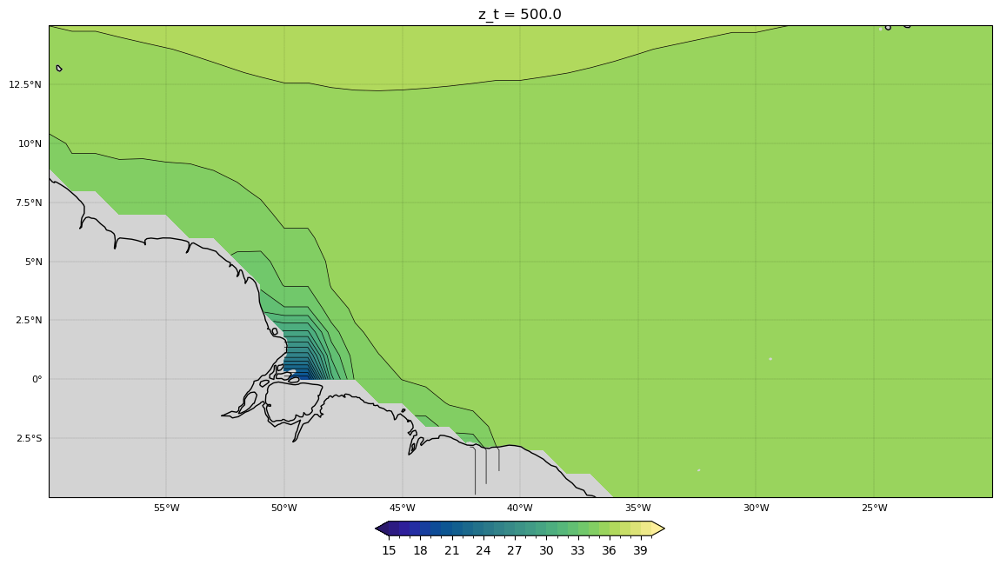

In [22]:
# Figure size
size = (14, 8)

# Color from cmocean
colormap = ocm.cm.haline

# Defining the figure
fig = plt.figure(figsize=size, facecolor='w', edgecolor='k')

# Axes with Cartopy projection
ax = plt.axes(projection=ccrs.PlateCarree())
# and extent
ax.set_extent([300, 340, -5, 15], ccrs.PlateCarree())

# Plotting using Matplotlib 
# We plot the PH at the surface at the final recorded time interval
clevs = np.linspace(15,40,26)

p1 = bebm_SALT.SALT[0,:,:].plot.contourf(levels = clevs, add_colorbar=False, cmap = colormap)
p10 = bebm_SALT.SALT[0,:,:].plot.contour(levels = clevs, colors='k', linewidths=0.5)
#cf = ds_bio.PH.isel(time=-1,k=-1).plot( 
#    transform=ccrs.PlateCarree(), cmap=color,
#    vmin = 7.975, vmax = 8.125,
#    add_colorbar=False
#)

# Color bar
cbar = plt.colorbar(p1, ax=ax, fraction=0.027, pad=0.045, 
orientation="horizontal")
#cbar.set_label(ds_bio.PH.long_name+' '+ds_bio.PH.units, rotation=0, 
#               labelpad=5, fontsize=10)
#cbar.ax.tick_params(labelsize=8)

# Title
#plt.title('zc = '+str(ds_bio.zc.values.item(-1))+' m at '+str(ds_bio.coords['time'].values[-1])[:10],
#          fontsize=11
#         )

# Plot lat/lon grid 
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.1, color='k', alpha=1, 
                  linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 8}
gl.ylabel_style = {'size': 8} 

# Add map features with Cartopy 
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m', 
                                            edgecolor='face', 
                                            facecolor='lightgray'))
ax.coastlines(linewidth=1)
ax.set_facecolor("lightgray")


WOCE Global Hydrographic Climatology
Gouretski, V. V. and K. P. Koltermann, Berichte des Bundesamtes für Seeschifffahrt und Hydrographie Nr. 35/2004 Gridded Data (0.5° x 0.5°) This page provides datasets for use with the Ocean Data View software. The datasets are platform-independent and can be used on any supported system (Windows, Linux, UNIX, Mac OS X). To install a dataset, download the zipped data file to the base directory of your ODV data and unzip the file. During unzipping make sure you restore the directory structure as stored in the zip-file (e.g., use "unzip <file-name>" or "pkunzip -d <file-name>", etc.). Open the data collection with Ocean Data View.

https://odv.awi.de/data/ocean/woce-global-hydrographic-climatology/

In [23]:
# load up some observed data
woce = xr.open_dataset("/home/guido/Dropbox/ipynb/estuary/obsdata/wghc_params.nc", engine="netcdf4")
woce_mask = xr.open_dataset("/home/guido/Dropbox/ipynb/estuary/obsdata/woa_3basin_ocean.nc", engine="netcdf4")

In [24]:
woce

<xarray.Dataset> Size: 562MB
Dimensions:   (LON: 720, LAT: 341, ZAX: 44)
Coordinates:
  * LON       (LON) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * LAT       (LAT) float64 3kB -80.0 -79.5 -79.0 -78.5 ... 88.5 89.0 89.5 90.0
  * ZAX       (ZAX) float64 352B 0.0 10.0 20.0 ... 5.25e+03 5.5e+03 5.75e+03
Data variables: (12/13)
    BOT_DEP   (ZAX, LAT, LON) float32 43MB ...
    PRES      (ZAX, LAT, LON) float32 43MB ...
    TEMP      (ZAX, LAT, LON) float32 43MB ...
    TPOTEN    (ZAX, LAT, LON) float32 43MB ...
    SALINITY  (ZAX, LAT, LON) float32 43MB ...
    OXYGEN    (ZAX, LAT, LON) float32 43MB ...
    ...        ...
    NITRATE   (ZAX, LAT, LON) float32 43MB ...
    PHOSPH    (ZAX, LAT, LON) float32 43MB ...
    GAMMAN    (ZAX, LAT, LON) float32 43MB ...
    SIG0      (ZAX, LAT, LON) float32 43MB ...
    SIG2      (ZAX, LAT, LON) float32 43MB ...
    SIG4      (ZAX, LAT, LON) float32 43MB ...
Attributes:
    history:      FERRET V6.62  23-Dec-10
    title:        WOCE Global Hydrographic Climatology Parameters
    Conventions:  CF-1.0

In [25]:
woce_mask

<xarray.Dataset> Size: 264kB
Dimensions:      (lat: 180, lon: 360)
Coordinates:
  * lat          (lat) float64 1kB -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
  * lon          (lon) float64 3kB 0.5 1.5 2.5 3.5 ... 356.5 357.5 358.5 359.5
Data variables:
    REGION_MASK  (lat, lon) float32 259kB ...

In [26]:
# need to use xesmf to transform the sea ice grid
wlon = np.linspace(-180.,180.,361)
wlat = np.linspace(-90.,90.,181)
#wlon = np.linspace(-180.,180.,721)
#wlat = np.linspace(-90.,90.,361)
# regrider
wgrid_in = {'lon': woce_mask['lon'], 'lat': woce_mask['lat']}
wgrid_out = {'lon': wlon, 'lat': wlat}
wregridder_base = xe.Regridder(wgrid_in, wgrid_out, 'nearest_s2d', reuse_weights=False)
def wregridder(var):
    var_attrs  = var.attrs
    var_name  = var.name
    #print(var_atts)
    #print(var_name)
    xarr_rg = wregridder_base(var).assign_attrs(var_attrs)
    xard_rg = xarr_rg.to_dataset(name=var_name)
    return  xard_rg

In [27]:
woce_mask_rg = wregridder(woce_mask.REGION_MASK)

In [28]:
woce_mask_rg

<xarray.Dataset> Size: 266kB
Dimensions:      (lat: 181, lon: 361)
Coordinates:
  * lat          (lat) float64 1kB -90.0 -89.0 -88.0 -87.0 ... 88.0 89.0 90.0
  * lon          (lon) float64 3kB -180.0 -179.0 -178.0 ... 178.0 179.0 180.0
Data variables:
    REGION_MASK  (lat, lon) float32 261kB 0.0 0.0 0.0 0.0 ... 1.0 1.0 1.0 1.0

In [29]:
# need to use xesmf to transform the sea ice grid
w1lon = np.linspace(-180.,180.,361)
w1lat = np.linspace(-90.,90.,181)
#w1lon = np.linspace(-180.,180.,721)
#w1lat = np.linspace(-90.,90.,361)
# regrider
w1grid_in = {'lon': woce['LON'], 'lat': woce['LAT']}
w1grid_out = {'lon': w1lon, 'lat': w1lat}
w1regridder_base = xe.Regridder(w1grid_in, w1grid_out, 'nearest_s2d', reuse_weights=False)
def w1regridder(var):
    var_attrs  = var.attrs
    var_name  = var.name
    #print(var_atts)
    #print(var_name)
    xarr_rg = w1regridder_base(var).drop("time").assign_attrs(var_attrs)
    xard_rg = xarr_rg.to_dataset(name=var_name)
    return  xard_rg

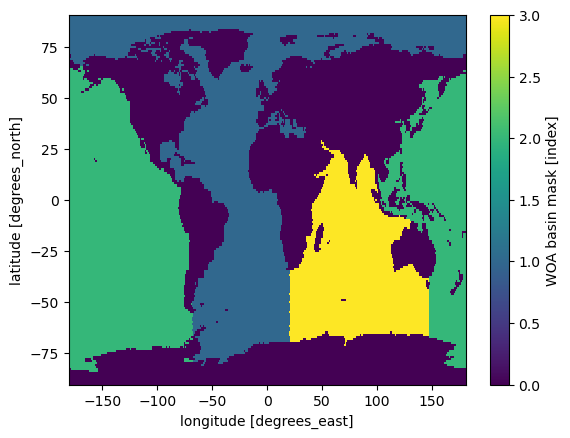

In [30]:
woce_mask_rg.REGION_MASK.plot()

In [31]:
woce_rg = w1regridder_base(woce)

In [32]:
woce_rg

<xarray.Dataset> Size: 150MB
Dimensions:   (ZAX: 44, lat: 181, lon: 361)
Coordinates:
  * ZAX       (ZAX) float64 352B 0.0 10.0 20.0 ... 5.25e+03 5.5e+03 5.75e+03
  * lat       (lat) float64 1kB -90.0 -89.0 -88.0 -87.0 ... 87.0 88.0 89.0 90.0
  * lon       (lon) float64 3kB -180.0 -179.0 -178.0 ... 178.0 179.0 180.0
Data variables: (12/13)
    BOT_DEP   (ZAX, lat, lon) float32 12MB -3.566e+03 -3.566e+03 ... 4.29e+03
    PRES      (ZAX, lat, lon) float32 12MB 0.0 0.0 0.0 ... 5.872e+03 5.872e+03
    TEMP      (ZAX, lat, lon) float32 12MB nan nan nan nan ... nan nan nan nan
    TPOTEN    (ZAX, lat, lon) float32 12MB nan nan nan nan ... nan nan nan nan
    SALINITY  (ZAX, lat, lon) float32 12MB nan nan nan nan ... nan nan nan nan
    OXYGEN    (ZAX, lat, lon) float32 12MB nan nan nan nan ... nan nan nan nan
    ...        ...
    NITRATE   (ZAX, lat, lon) float32 12MB nan nan nan nan ... nan nan nan nan
    PHOSPH    (ZAX, lat, lon) float32 12MB nan nan nan nan ... nan nan nan nan
    GAMMAN    (ZAX, lat, lon) float32 12MB nan nan nan nan ... nan nan nan nan
    SIG0      (ZAX, lat, lon) float32 12MB nan nan nan nan ... nan nan nan nan
    SIG2      (ZAX, lat, lon) float32 12MB nan nan nan nan ... nan nan nan nan
    SIG4      (ZAX, lat, lon) float32 12MB nan nan nan nan ... nan nan nan nan
Attributes:
    regrid_method:  nearest_s2d

In [33]:
woce_rg.ZAX

<xarray.DataArray 'ZAX' (ZAX: 44)> Size: 352B
array([   0.,   10.,   20.,   30.,   40.,   50.,   75.,  100.,  125.,  150.,
        175.,  200.,  250.,  300.,  350.,  400.,  500.,  600.,  700.,  800.,
        900., 1000., 1100., 1200., 1300., 1400., 1500., 1750., 2000., 2250.,
       2500., 2750., 3000., 3250., 3500., 3750., 4000., 4250., 4500., 4750.,
       5000., 5250., 5500., 5750.])
Coordinates:
  * ZAX      (ZAX) float64 352B 0.0 10.0 20.0 30.0 ... 5.25e+03 5.5e+03 5.75e+03

In [34]:
woce_rg.interp(ZAX=bebm_SALT.z_t/100.)

<xarray.Dataset> Size: 408MB
Dimensions:   (z_t: 60, lat: 181, lon: 361)
Coordinates:
  * lat       (lat) float64 1kB -90.0 -89.0 -88.0 -87.0 ... 87.0 88.0 89.0 90.0
  * lon       (lon) float64 3kB -180.0 -179.0 -178.0 ... 178.0 179.0 180.0
    ZAX       (z_t) float32 240B 5.0 15.0 25.0 ... 4.875e+03 5.125e+03 5.375e+03
  * z_t       (z_t) float32 240B 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
Data variables: (12/13)
    BOT_DEP   (z_t, lat, lon) float64 31MB -3.566e+03 -3.566e+03 ... 4.29e+03
    PRES      (z_t, lat, lon) float64 31MB 5.0 5.0 5.0 ... 5.484e+03 5.484e+03
    TEMP      (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    TPOTEN    (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    SALINITY  (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    OXYGEN    (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    ...        ...
    NITRATE   (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    PHOSPH    (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    GAMMAN    (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    SIG0      (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    SIG2      (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    SIG4      (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
Attributes:
    regrid_method:  nearest_s2d

In [35]:
#woce_rg_z_t_PHOSPH = linear_interpolation_remap(woce_rg.ZAX, woce_rg.PHOSPH, bebm_SALT.z_t)
woce_rg_z_t = woce_rg.interp(ZAX=bebm_SALT.z_t/100.).drop_vars("ZAX")

In [36]:
woce_rg_glo = woce_rg_z_t
woce_rg_atl = woce_rg_z_t.where(woce_mask_rg.REGION_MASK == 1)
woce_rg_pac = woce_rg_z_t.where(woce_mask_rg.REGION_MASK == 2)
woce_rg_ind = woce_rg_z_t.where(woce_mask_rg.REGION_MASK == 3)


In [37]:
woce_rg_glo

<xarray.Dataset> Size: 408MB
Dimensions:   (z_t: 60, lat: 181, lon: 361)
Coordinates:
  * lat       (lat) float64 1kB -90.0 -89.0 -88.0 -87.0 ... 87.0 88.0 89.0 90.0
  * lon       (lon) float64 3kB -180.0 -179.0 -178.0 ... 178.0 179.0 180.0
  * z_t       (z_t) float32 240B 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
Data variables: (12/13)
    BOT_DEP   (z_t, lat, lon) float64 31MB -3.566e+03 -3.566e+03 ... 4.29e+03
    PRES      (z_t, lat, lon) float64 31MB 5.0 5.0 5.0 ... 5.484e+03 5.484e+03
    TEMP      (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    TPOTEN    (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    SALINITY  (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    OXYGEN    (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    ...        ...
    NITRATE   (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    PHOSPH    (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    GAMMAN    (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    SIG0      (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    SIG2      (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    SIG4      (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
Attributes:
    regrid_method:  nearest_s2d

In [38]:
bebm_SALT

<xarray.Dataset> Size: 16MB
Dimensions:  (z_t: 60, lat: 181, lon: 361)
Coordinates:
  * z_t      (z_t) float32 240B 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
  * lat      (lat) float64 1kB -90.0 -89.0 -88.0 -87.0 ... 87.0 88.0 89.0 90.0
  * lon      (lon) float64 3kB -180.0 -179.0 -178.0 -177.0 ... 178.0 179.0 180.0
Data variables:
    SALT     (z_t, lat, lon) float32 16MB nan nan nan nan ... nan nan nan nan

In [39]:
def set_amazon_grid(ax, labelsize, xon=True, yon=True):
    # Set lat/lon grid 
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.1, color='k', alpha=1, 
                      linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bot_labels = xon
    gl.left_labels = yon
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': labelsize}
    gl.ylabel_style = {'size': labelsize} 
    #mext = [290, 360, -25, 25]
    #xext = np.linspace(mext[0],mext[1],8)
    #print(xext)
    #gl.xlocator = mticker.FixedLocator(xext)
    #yext = np.linspace(mext[0],mext[-1],10)
    #gl.ylocator = mticker.FixedLocator([10, 20, 30, 40, 50])

    # Add map features with Cartopy 
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m', 
                                                edgecolor='face', 
                                                facecolor='gray'))
    ax.add_feature(cfeature.RIVERS)                                   
    ax.coastlines(linewidth=1)
    ax.set_facecolor("gray")

def call_vert_cbar(pfig, ax, cx, cy, pl, cbstr, width=0.02):
    pos = ax.get_position()
    l, b, w, h = pos.bounds
    cbarxoffset=cx
    cbaryoffset=cy
    cbax = pfig.add_axes([l+cbarxoffset+w, b+cbaryoffset, width, h]) # setup colorbar axes
    cb=fig.colorbar(pl,cax=cbax, orientation='vertical') # draw colorbar
    cb.set_label(cbstr,y=0.5, size='large', weight='bold')


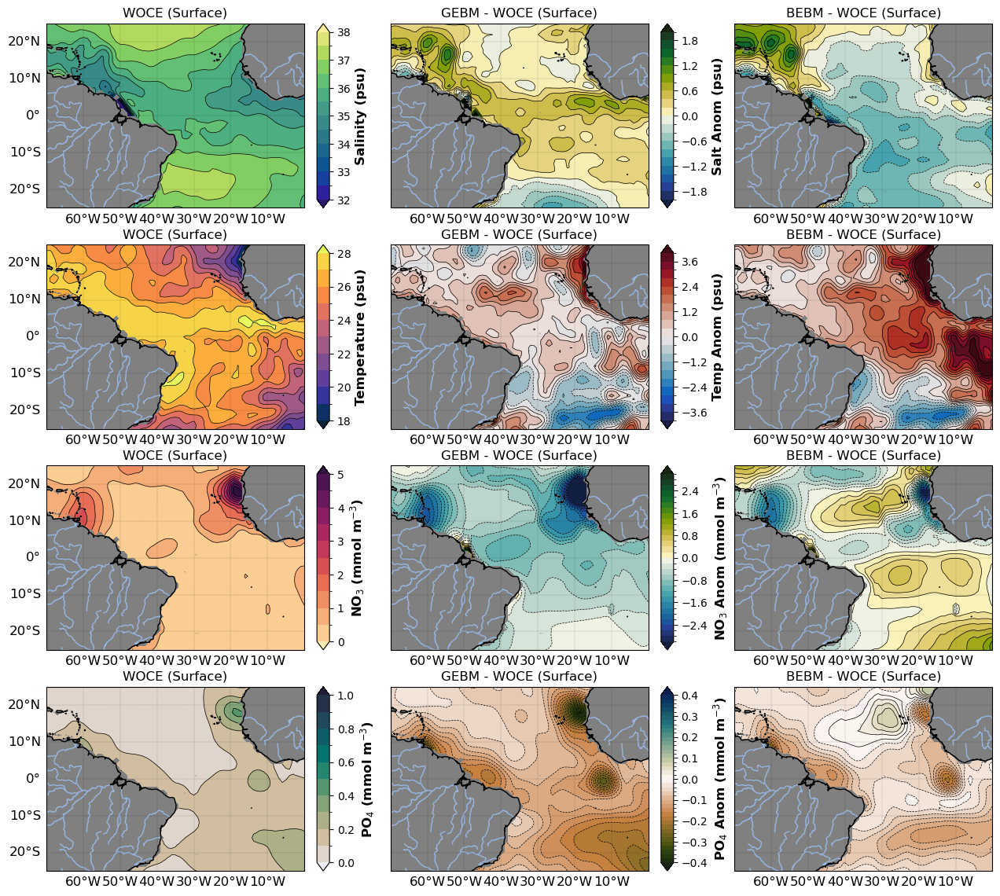

In [40]:
fig = plt.figure(figsize=(16,14))

colmap = ocm.cm.haline
acolmap = plt.cm.bwr

clev = np.linspace(-40,40,41)
alev = np.linspace(-4,4,41)

ax1 = plt.subplot(431,projection=ccrs.PlateCarree())
ax2 = plt.subplot(432,projection=ccrs.PlateCarree())
ax3 = plt.subplot(433,projection=ccrs.PlateCarree())

ax4 = plt.subplot(434,projection=ccrs.PlateCarree())
ax5 = plt.subplot(435,projection=ccrs.PlateCarree())
ax6 = plt.subplot(436,projection=ccrs.PlateCarree())

ax7 = plt.subplot(437,projection=ccrs.PlateCarree())
ax8 = plt.subplot(438,projection=ccrs.PlateCarree())
ax9 = plt.subplot(439,projection=ccrs.PlateCarree())

ax10 = plt.subplot(4,3,10,projection=ccrs.PlateCarree())
ax11 = plt.subplot(4,3,11,projection=ccrs.PlateCarree())
ax12 = plt.subplot(4,3,12,projection=ccrs.PlateCarree())

titlesize=14
axeslbfs=14
axesfs=12
cbarsx = 0.01 # shift colorbars right a bit

mapextent = [290, 360, -25, 25]
zlev = 0
levstr = "(Surface)"

# obs salt
colmap = ocm.cm.haline
clevs = np.linspace(32,38,13)

ax1.set_extent(mapextent, ccrs.PlateCarree())
p1 = woce_rg_glo.SALINITY[zlev,:,:].plot.contourf(ax = ax1, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p1_0 = woce_rg_glo.SALINITY[zlev,:,:].plot.contour(ax = ax1, levels = clevs, colors='k', linewidths=0.5)
set_amazon_grid(ax1,12)
ax1.set_title("WOCE " + levstr)
cbstr="Salinity (psu)"
call_vert_cbar(fig, ax1, cbarsx, 0.0, p1, cbstr, width=0.01)

# Differences salt
dcolmap = ocm.cm.delta
dlevs = np.linspace(-2,2,21)

ax2.set_extent(mapextent, ccrs.PlateCarree())
p2 = (gebm_SALT.SALT[zlev,:,:] - woce_rg_glo.SALINITY[0,:,:]).plot.contourf(ax = ax2, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p2_0 = (gebm_SALT.SALT[zlev,:,:] - woce_rg_glo.SALINITY[0,:,:]).plot.contour(ax = ax2, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_grid(ax2,12, yon=False)
ax2.set_title("GEBM - WOCE " + levstr)
cbstr="Salt Anom (psu)"
call_vert_cbar(fig, ax2, cbarsx, 0.0, p2, cbstr, width=0.01)

ax3.set_extent(mapextent, ccrs.PlateCarree())
p3 = (bebm_SALT.SALT[zlev,:,:] - woce_rg_glo.SALINITY[0,:,:]).plot.contourf(ax = ax3, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p3_0 = (bebm_SALT.SALT[zlev,:,:] - woce_rg_glo.SALINITY[0,:,:]).plot.contour(ax = ax3, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_grid(ax3,12, yon=False)
ax3.set_title("BEBM - WOCE " + levstr)

# obs temp
colmap = ocm.cm.thermal
clevs = np.linspace(18,28,11)

ax4.set_extent(mapextent, ccrs.PlateCarree())
p4 = woce_rg_glo.TPOTEN[zlev,:,:].plot.contourf(ax = ax4, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p4_0 = woce_rg_glo.TPOTEN[zlev,:,:].plot.contour(ax = ax4, levels = clevs, colors='k', linewidths=0.5)
set_amazon_grid(ax4,12)
ax4.set_title("WOCE " + levstr)
cbstr="Temperature (psu)"
call_vert_cbar(fig, ax4, cbarsx, 0.0, p4, cbstr, width=0.01)

# Differences temp
dcolmap = ocm.cm.balance
dlevs = np.linspace(-4,4,21)

ax5.set_extent(mapextent, ccrs.PlateCarree())
p5 = (gebm_TEMP.TEMP[zlev,:,:] - woce_rg_glo.TPOTEN[0,:,:]).plot.contourf(ax = ax5, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p5_0 = (gebm_TEMP.TEMP[zlev,:,:] - woce_rg_glo.TPOTEN[0,:,:]).plot.contour(ax = ax5, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_grid(ax5,12, yon=False)
ax5.set_title("GEBM - WOCE " + levstr)
cbstr="Temp Anom (psu)"
call_vert_cbar(fig, ax5, cbarsx, 0.0, p5, cbstr, width=0.01)

ax6.set_extent(mapextent, ccrs.PlateCarree())
p6 = (bebm_TEMP.TEMP[zlev,:,:] - woce_rg_glo.TPOTEN[0,:,:]).plot.contourf(ax = ax6, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p6_0 = (bebm_TEMP.TEMP[zlev,:,:] - woce_rg_glo.TPOTEN[0,:,:]).plot.contour(ax = ax6, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_grid(ax6,12, yon=False)
ax6.set_title("BEBM - WOCE " + levstr)

# obs nitrate
colmap = ocm.cm.matter
clevs = np.linspace(0,5,11)

ax7.set_extent(mapextent, ccrs.PlateCarree())
p7 = woce_rg_glo.NITRATE[zlev,:,:].plot.contourf(ax = ax7, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p7_0 = woce_rg_glo.NITRATE[zlev,:,:].plot.contour(ax = ax7, levels = clevs, colors='k', linewidths=0.5)
set_amazon_grid(ax7,12)
ax7.set_title("WOCE " + levstr)
cbstr="NO$_3$ (mmol m$^{-3}$)"
call_vert_cbar(fig, ax7, cbarsx, 0.0, p7, cbstr, width=0.01)

# Differences Nitrate
dcolmap = ocm.cm.delta
dlevs = np.linspace(-3,3,31)

ax8.set_extent(mapextent, ccrs.PlateCarree())
p8 = (gebm_NO3.NO3[zlev,:,:] - woce_rg_glo.NITRATE[0,:,:]).plot.contourf(ax = ax8, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p8_0 = (gebm_NO3.NO3[zlev,:,:] - woce_rg_glo.NITRATE[0,:,:]).plot.contour(ax = ax8, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_grid(ax8,12, yon=False)
ax8.set_title("GEBM - WOCE " + levstr)
cbstr="NO$_3$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax8, cbarsx, 0.0, p8, cbstr, width=0.01)

ax9.set_extent(mapextent, ccrs.PlateCarree())
p9 = (bebm_NO3.NO3[zlev,:,:] - woce_rg_glo.NITRATE[0,:,:]).plot.contourf(ax = ax9, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p9_0 = (bebm_NO3.NO3[zlev,:,:] - woce_rg_glo.NITRATE[0,:,:]).plot.contour(ax = ax9, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_grid(ax9,12, yon=False)
ax9.set_title("BEBM - WOCE " + levstr)

# obs phosphate
colmap=ocm.cm.rain
clevs=np.linspace(0,1, 11)

ax10.set_extent(mapextent, ccrs.PlateCarree())
p10 = woce_rg_glo.PHOSPH[zlev,:,:].plot.contourf(ax = ax10, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p10_0 = woce_rg_glo.PHOSPH[zlev,:,:].plot.contour(ax = ax10, levels = clevs, colors='k', linewidths=0.5)
set_amazon_grid(ax10,12)
ax10.set_title("WOCE " + levstr)
cbstr="PO$_4$ (mmol m$^{-3}$)"
call_vert_cbar(fig, ax10, cbarsx, 0.0, p10, cbstr, width=0.01)

# Differences phosphate
dcolmap=ocm.cm.reg_map
dlevs=np.linspace(-0.4,0.4,41)

ax11.set_extent(mapextent, ccrs.PlateCarree())
p11 = (gebm_PO4.PO4[zlev,:,:] - woce_rg_glo.PHOSPH[0,:,:]).plot.contourf(ax = ax11, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p11_0 = (gebm_PO4.PO4[zlev,:,:] - woce_rg_glo.PHOSPH[0,:,:]).plot.contour(ax = ax11, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_grid(ax11,12, yon=False)
ax11.set_title("GEBM - WOCE " + levstr)
cbstr="PO$_4$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax11, cbarsx, 0.0, p11, cbstr, width=0.01)

ax12.set_extent(mapextent, ccrs.PlateCarree())
p12 = (bebm_PO4.PO4[zlev,:,:] - woce_rg_glo.PHOSPH[0,:,:]).plot.contourf(ax = ax12, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p12_0 = (bebm_PO4.PO4[zlev,:,:] - woce_rg_glo.PHOSPH[0,:,:]).plot.contour(ax = ax12, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_grid(ax12,12, yon=False)
ax12.set_title("BEBM - WOCE " + levstr)


#plt.subplots_adjust(hspace=0.35, wspace=.25)

icepaperdir="/home/guido/Dropbox/plots/estuaries/"
saveplot=False

if saveplot:
    plt.savefig(icepaperdir+"Figure_Amazon_surf.png", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)
    plt.savefig(icepaperdir+"Figure_Amazon_surf.pdf", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)



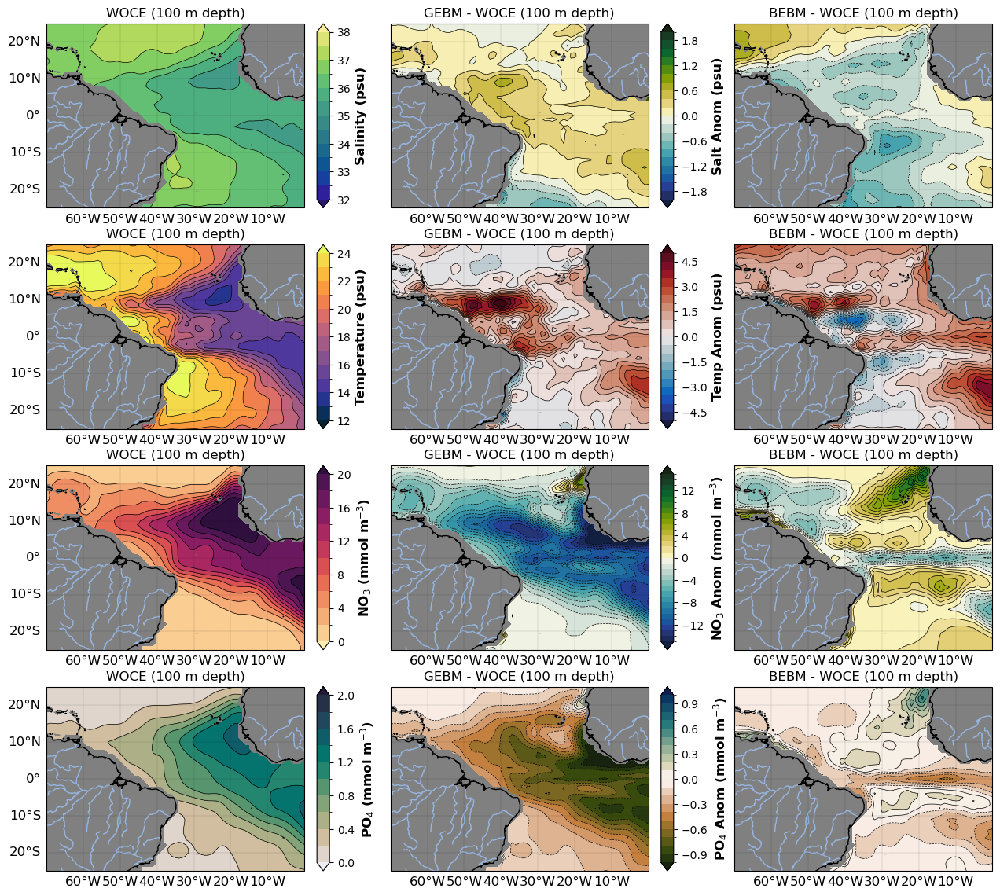

In [41]:
fig = plt.figure(figsize=(16,14))

colmap = ocm.cm.haline
acolmap = plt.cm.bwr

clev = np.linspace(-40,40,41)
alev = np.linspace(-4,4,41)

ax1 = plt.subplot(431,projection=ccrs.PlateCarree())
ax2 = plt.subplot(432,projection=ccrs.PlateCarree())
ax3 = plt.subplot(433,projection=ccrs.PlateCarree())

ax4 = plt.subplot(434,projection=ccrs.PlateCarree())
ax5 = plt.subplot(435,projection=ccrs.PlateCarree())
ax6 = plt.subplot(436,projection=ccrs.PlateCarree())

ax7 = plt.subplot(437,projection=ccrs.PlateCarree())
ax8 = plt.subplot(438,projection=ccrs.PlateCarree())
ax9 = plt.subplot(439,projection=ccrs.PlateCarree())

ax10 = plt.subplot(4,3,10,projection=ccrs.PlateCarree())
ax11 = plt.subplot(4,3,11,projection=ccrs.PlateCarree())
ax12 = plt.subplot(4,3,12,projection=ccrs.PlateCarree())

titlesize=14
axeslbfs=14
axesfs=12
cbarsx = 0.01 # shift colorbars right a bit

mapextent = [290, 360, -25, 25]
zlev = 10
levstr = "(100 m depth)"

# obs salt
colmap = ocm.cm.haline
clevs = np.linspace(32,38,13)

ax1.set_extent(mapextent, ccrs.PlateCarree())
p1 = woce_rg_glo.SALINITY[zlev,:,:].plot.contourf(ax = ax1, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p1_0 = woce_rg_glo.SALINITY[zlev,:,:].plot.contour(ax = ax1, levels = clevs, colors='k', linewidths=0.5)
set_amazon_grid(ax1,12)
ax1.set_title("WOCE " + levstr)
cbstr="Salinity (psu)"
call_vert_cbar(fig, ax1, cbarsx, 0.0, p1, cbstr, width=0.01)

# Differences salt
dcolmap = ocm.cm.delta
dlevs = np.linspace(-2,2,21)

ax2.set_extent(mapextent, ccrs.PlateCarree())
p2 = (gebm_SALT.SALT[zlev,:,:] - woce_rg_glo.SALINITY[zlev,:,:]).plot.contourf(ax = ax2, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p2_0 = (gebm_SALT.SALT[zlev,:,:] - woce_rg_glo.SALINITY[zlev,:,:]).plot.contour(ax = ax2, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_grid(ax2,12, yon=False)
ax2.set_title("GEBM - WOCE " + levstr)
cbstr="Salt Anom (psu)"
call_vert_cbar(fig, ax2, cbarsx, 0.0, p2, cbstr, width=0.01)

ax3.set_extent(mapextent, ccrs.PlateCarree())
p3 = (bebm_SALT.SALT[zlev,:,:] - woce_rg_glo.SALINITY[zlev,:,:]).plot.contourf(ax = ax3, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p3_0 = (bebm_SALT.SALT[zlev,:,:] - woce_rg_glo.SALINITY[zlev,:,:]).plot.contour(ax = ax3, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_grid(ax3,12, yon=False)
ax3.set_title("BEBM - WOCE " + levstr)

# obs temp
colmap = ocm.cm.thermal
clevs = np.linspace(12,24,13)

ax4.set_extent(mapextent, ccrs.PlateCarree())
p4 = woce_rg_glo.TPOTEN[zlev,:,:].plot.contourf(ax = ax4, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p4_0 = woce_rg_glo.TPOTEN[zlev,:,:].plot.contour(ax = ax4, levels = clevs, colors='k', linewidths=0.5)
set_amazon_grid(ax4,12)
ax4.set_title("WOCE " + levstr)
cbstr="Temperature (psu)"
call_vert_cbar(fig, ax4, cbarsx, 0.0, p4, cbstr, width=0.01)

# Differences temp
dcolmap = ocm.cm.balance
dlevs = np.linspace(-5,5,21)

ax5.set_extent(mapextent, ccrs.PlateCarree())
p5 = (gebm_TEMP.TEMP[zlev,:,:] - woce_rg_glo.TPOTEN[zlev,:,:]).plot.contourf(ax = ax5, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p5_0 = (gebm_TEMP.TEMP[zlev,:,:] - woce_rg_glo.TPOTEN[zlev,:,:]).plot.contour(ax = ax5, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_grid(ax5,12, yon=False)
ax5.set_title("GEBM - WOCE " + levstr)
cbstr="Temp Anom (psu)"
call_vert_cbar(fig, ax5, cbarsx, 0.0, p5, cbstr, width=0.01)

ax6.set_extent(mapextent, ccrs.PlateCarree())
p6 = (bebm_TEMP.TEMP[zlev,:,:] - woce_rg_glo.TPOTEN[zlev,:,:]).plot.contourf(ax = ax6, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p6_0 = (bebm_TEMP.TEMP[zlev,:,:] - woce_rg_glo.TPOTEN[zlev,:,:]).plot.contour(ax = ax6, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_grid(ax6,12, yon=False)
ax6.set_title("BEBM - WOCE " + levstr)

# obs nitrate
colmap = ocm.cm.matter
clevs = np.linspace(0,20,11)

ax7.set_extent(mapextent, ccrs.PlateCarree())
p7 = woce_rg_glo.NITRATE[zlev,:,:].plot.contourf(ax = ax7, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p7_0 = woce_rg_glo.NITRATE[zlev,:,:].plot.contour(ax = ax7, levels = clevs, colors='k', linewidths=0.5)
set_amazon_grid(ax7,12)
ax7.set_title("WOCE " + levstr)
cbstr="NO$_3$ (mmol m$^{-3}$)"
call_vert_cbar(fig, ax7, cbarsx, 0.0, p7, cbstr, width=0.01)

# Differences Nitrate
dcolmap = ocm.cm.delta
dlevs = np.linspace(-15,15,31)

ax8.set_extent(mapextent, ccrs.PlateCarree())
p8 = (gebm_NO3.NO3[zlev,:,:] - woce_rg_glo.NITRATE[zlev,:,:]).plot.contourf(ax = ax8, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p8_0 = (gebm_NO3.NO3[zlev,:,:] - woce_rg_glo.NITRATE[zlev,:,:]).plot.contour(ax = ax8, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_grid(ax8,12, yon=False)
ax8.set_title("GEBM - WOCE " + levstr)
cbstr="NO$_3$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax8, cbarsx, 0.0, p8, cbstr, width=0.01)

ax9.set_extent(mapextent, ccrs.PlateCarree())
p9 = (bebm_NO3.NO3[zlev,:,:] - woce_rg_glo.NITRATE[zlev,:,:]).plot.contourf(ax = ax9, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p9_0 = (bebm_NO3.NO3[zlev,:,:] - woce_rg_glo.NITRATE[zlev,:,:]).plot.contour(ax = ax9, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_grid(ax9,12, yon=False)
ax9.set_title("BEBM - WOCE " + levstr)

# obs phosphate
colmap=ocm.cm.rain
clevs=np.linspace(0,2, 11)

ax10.set_extent(mapextent, ccrs.PlateCarree())
p10 = woce_rg_glo.PHOSPH[zlev,:,:].plot.contourf(ax = ax10, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p10_0 = woce_rg_glo.PHOSPH[zlev,:,:].plot.contour(ax = ax10, levels = clevs, colors='k', linewidths=0.5)
set_amazon_grid(ax10,12)
ax10.set_title("WOCE " + levstr)
cbstr="PO$_4$ (mmol m$^{-3}$)"
call_vert_cbar(fig, ax10, cbarsx, 0.0, p10, cbstr, width=0.01)

# Differences phosphate
dcolmap=ocm.cm.reg_map
dlevs=np.linspace(-1,1,21)

ax11.set_extent(mapextent, ccrs.PlateCarree())
p11 = (gebm_PO4.PO4[zlev,:,:] - woce_rg_glo.PHOSPH[zlev,:,:]).plot.contourf(ax = ax11, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p11_0 = (gebm_PO4.PO4[zlev,:,:] - woce_rg_glo.PHOSPH[zlev,:,:]).plot.contour(ax = ax11, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_grid(ax11,12, yon=False)
ax11.set_title("GEBM - WOCE " + levstr)
cbstr="PO$_4$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax11, cbarsx, 0.0, p11, cbstr, width=0.01)

ax12.set_extent(mapextent, ccrs.PlateCarree())
p12 = (bebm_PO4.PO4[zlev,:,:] - woce_rg_glo.PHOSPH[zlev,:,:]).plot.contourf(ax = ax12, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p12_0 = (bebm_PO4.PO4[zlev,:,:] - woce_rg_glo.PHOSPH[zlev,:,:]).plot.contour(ax = ax12, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_grid(ax12,12, yon=False)
ax12.set_title("BEBM - WOCE " + levstr)


#plt.subplots_adjust(hspace=0.35, wspace=.25)

icepaperdir="/home/guido/Dropbox/plots/estuaries/"
saveplot=False

if saveplot:
    plt.savefig(icepaperdir+"Figure_Amazon_100m.png", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)
    plt.savefig(icepaperdir+"Figure_Amazon_100m.pdf", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)



In [42]:
gebm_3d_vars

<xarray.Dataset> Size: 94MB
Dimensions:  (z_t: 60, lat: 181, lon: 361)
Coordinates:
  * z_t      (z_t) float32 240B 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
  * lat      (lat) float64 1kB -90.0 -89.0 -88.0 -87.0 ... 87.0 88.0 89.0 90.0
  * lon      (lon) float64 3kB -180.0 -179.0 -178.0 -177.0 ... 178.0 179.0 180.0
Data variables:
    TEMP     (z_t, lat, lon) float32 16MB nan nan nan nan ... nan nan nan nan
    SALT     (z_t, lat, lon) float32 16MB nan nan nan nan ... nan nan nan nan
    O2       (z_t, lat, lon) float32 16MB nan nan nan nan ... nan nan nan nan
    SiO3     (z_t, lat, lon) float32 16MB nan nan nan nan ... nan nan nan nan
    NO3      (z_t, lat, lon) float32 16MB nan nan nan nan ... nan nan nan nan
    PO4      (z_t, lat, lon) float32 16MB nan nan nan nan ... nan nan nan nan

In [43]:
woce_rg_glo

<xarray.Dataset> Size: 408MB
Dimensions:   (z_t: 60, lat: 181, lon: 361)
Coordinates:
  * lat       (lat) float64 1kB -90.0 -89.0 -88.0 -87.0 ... 87.0 88.0 89.0 90.0
  * lon       (lon) float64 3kB -180.0 -179.0 -178.0 ... 178.0 179.0 180.0
  * z_t       (z_t) float32 240B 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05
Data variables: (12/13)
    BOT_DEP   (z_t, lat, lon) float64 31MB -3.566e+03 -3.566e+03 ... 4.29e+03
    PRES      (z_t, lat, lon) float64 31MB 5.0 5.0 5.0 ... 5.484e+03 5.484e+03
    TEMP      (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    TPOTEN    (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    SALINITY  (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    OXYGEN    (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    ...        ...
    NITRATE   (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    PHOSPH    (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    GAMMAN    (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    SIG0      (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    SIG2      (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
    SIG4      (z_t, lat, lon) float64 31MB nan nan nan nan ... nan nan nan nan
Attributes:
    regrid_method:  nearest_s2d

In [44]:
woce_rg_glo["TPOTEN"]

<xarray.DataArray 'TPOTEN' (z_t: 60, lat: 181, lon: 361)> Size: 31MB
array([[[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [-1.63628948, -1.63513601, -1.63387597, ..., -1.63828951,
         -1.63726252, -1.63628948],
        [-1.622639  , -1.62183851, -1.621185  , ..., -1.624147  ,
         -1.62333304, -1.622639  ],
        [-1.63270998, -1.63270998, -1.63270998, ..., -1.63270998,
         -1.63270998, -1.63270998]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
...
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan]]])
Coordinates:
  * lat      (lat) float64 1kB -90.0 -89.0 -88.0 -87.0 ... 87.0 88.0 89.0 90.0
  * lon      (lon) float64 3kB -180.0 -179.0 -178.0 -177.0 ... 178.0 179.0 180.0
  * z_t      (z_t) float32 240B 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05

In [45]:
def depth_lon_section_gplot(ovar="TPOTEN", gvar="TEMP", lat=0.0, lon1=-180, lon2=180, d1=0, d2=500000, dc=500, ds=20):

    #def set_scale(axx):
    #    linear_piecewise_scale(50000, 20, ax = axx)
    #    # Rearange the yticks
    #    axx.set_yticks([0, 12500, 25000, 37500, 50000, 200000, 400000, 600000]);
    #    axx.axhline(50000, color='0.5', ls='--')
    def set_scale_obs(axx):
        linear_piecewise_scale(dc, ds, ax = axx)
        # Rearange the yticks
        #axx.set_yticks([0, 125, 250, 375, 500, 2000, 4000, 6000]);
        dticks = np.linspace(0,d2,10)
        axx.set_yticks([0, 125, 250, 375, 500, 2000, 4000, 6000]);
        axx.axhline(500, color='0.5', ls='--')
    def set_scale(axx):
        linear_piecewise_scale(dc*10, ds, ax = axx)
        # Rearange the yticks
        axx.set_yticks([0.0, 12500., 25000., 37500., 50000., 200000., 400000., 600000.]);
        axx.set_yticklabels(["0", "125", "250", "375", "500", "2000", "4000", "6000"]);
        axx.axhline(50000, color='0.5', ls='--')
        
    if gvar == "SALT":
        colmap = ocm.cm.haline
        clevs = np.linspace(32,38,13)
        dcolmap = ocm.cm.delta
        dclevs = np.linspace(-2,2,21)
    elif gvar == "TEMP":
        colmap = ocm.cm.thermal
        clevs = np.linspace(8,28,11)
        dcolmap = ocm.cm.balance
        dclevs = np.linspace(-4,4,21)
    elif gvar == "O2":
        colmap = ocm.cm.algae_r
        clevs = np.linspace(0,10,11)
        dcolmap = ocm.cm.curl
        dclevs = np.linspace(-10,10,21)
    elif gvar == "SiO3":
        colmap=ocm.cm.deep
        clevs=np.linspace(0,100, 11)
        dcolmap=ocm.cm.delta_r
        dclevs=np.linspace(-10,10,21)
    elif gvar == "NO3":
        colmap = ocm.cm.matter
        clevs = np.linspace(0,50,11)
        dcolmap = ocm.cm.delta
        dclevs = np.linspace(-10,10,21)
    elif gvar == "PO4":
        colmap=ocm.cm.rain
        clevs=np.linspace(0,5, 11)
        dcolmap=ocm.cm.reg_map
        dclevs=np.linspace(-1,1,41)
    else:
            print("The var does not exist.")
        
    units = gebm_3d_vars[gvar].units
    if lat > 0:
        ns_str="N"
    elif lat <0:
        ns_str="S"
    else:
        ns_str=""
        
    latstr = str(abs(int(lat)))+"$\degree$"+ns_str
    
    fig, axs = plt.subplots(2, 2, figsize=(14,10))
    #colmap = ocm.cm.thermal
    #clevs = np.linspace(0,20,21)

    obs_sect = woce_rg_glo[ovar].sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
    #print(obs_sect)
    obs_p = obs_sect.plot.contourf(ax = axs[0,0], levels=clevs,  cmap=colmap, extend='both',
                                add_colorbar=True, robust = True, cbar_kwargs = ({"label":gvar+" ("+units+")"}))
    axs[0,0].set_facecolor('grey')
    axs[0,0].invert_yaxis()
    axs[0,0].set_title("WOCE Observed: "+latstr)
    
    g_sect = gebm_3d_vars[gvar].sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
    #print(obs_sect)
    g_p = g_sect.plot.contourf(ax = axs[0,1], levels=clevs,  cmap=colmap, extend='both',
                                add_colorbar=True, robust = True, cbar_kwargs = ({"label":gvar+" ("+units+")"}))
    axs[0,1].set_facecolor('grey')
    axs[0,1].invert_yaxis()
    axs[0,1].set_title("GEBM Observed: "+latstr)

    #dcolmap = ocm.cm.balance
    #dclevs = np.linspace(-4,4,21)
    geo_sect = (gebm_3d_vars[gvar] - woce_rg_glo[ovar]).sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
    #print(obs_sect)
    geo_p = geo_sect.plot.contourf(ax = axs[1,0], levels=dclevs,  cmap=dcolmap, extend='both',
                                add_colorbar=True, robust = True, cbar_kwargs = ({"label":gvar+" ("+units+")"}))
    axs[1,0].set_facecolor('grey')
    axs[1,0].invert_yaxis()
    axs[1,0].set_title("GEBM - WOCE: "+latstr)

    gebe_sect = (gebm_3d_vars[gvar] - bebm_3d_vars[gvar]).sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
    #print(obs_sect)
    gebe_p = gebe_sect.plot.contourf(ax = axs[1,1], levels=dclevs,  cmap=dcolmap, extend='both',
                                add_colorbar=True, robust = True, cbar_kwargs = ({"label":gvar+" ("+units+")"}))
    axs[1,1].set_facecolor('grey')
    axs[1,1].invert_yaxis()
    axs[1,1].set_title("GEBM - BEBM: "+latstr)


    #axs.set_title('Title')
    #set_scale(axs)

    for ax in axs.flat:
        ax.set(xlabel='Longitude ($^\circ$E)', ylabel='Depth (cm)')

    # Hide x labels and tick labels for top plots and y ticks for right plots.
    #for ax in axs.flat:
    #    ax.label_outer()

    #fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.8,
    #                    wspace=0.04, hspace=0.15)
    #cb_ax = fig.add_axes([0.83, 0.1, 0.02, 0.8])
    #cbar = fig.colorbar(gp, cax=cb_ax)


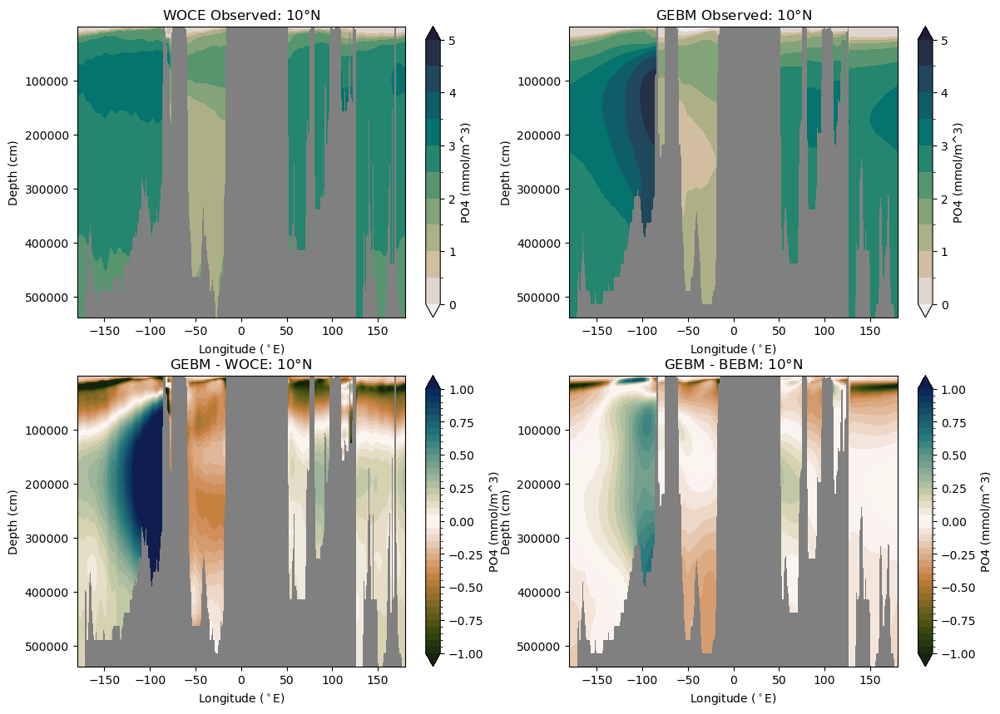

In [46]:
depth_lon_section_gplot("PHOSPH","PO4", 10.0, -180., 180., 0,600000) 

In [47]:
woce_vars = ["TPOTEN", "SALINITY", "OXYGEN", "SILICATE", "NITRATE", "PHOSPH"]
cesm_vars = ["TEMP", "SALT", "O2", "SiO3", "NO3", "PO4" ]

interactive(children=(Dropdown(description='ovar', options=('TPOTEN', 'SALINITY', 'OXYGEN', 'SILICATE', 'NITRA…

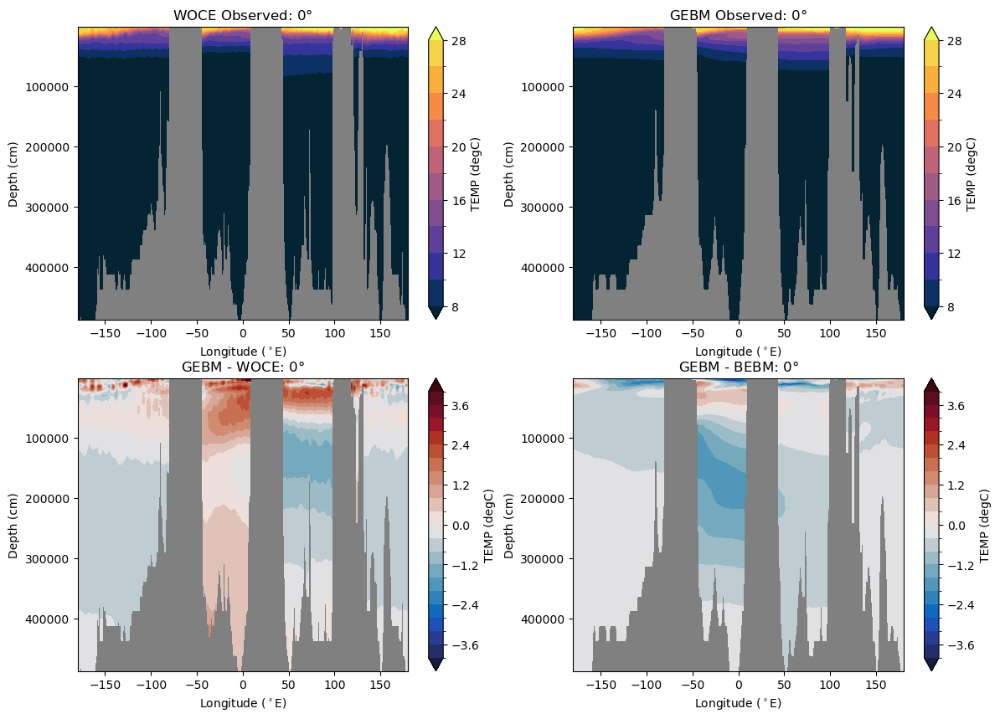

In [48]:
interactive_plot = interactive(depth_lon_section_gplot,
                               ovar=woce_vars,
                               gvar=cesm_vars,
                               lat=(-90,90,10),
                               lon1=(-180,180,10),
                               lon2=(-180,180,10),
                               d1=(0,600000,1000),
                               d2=(0,600000,1000),                               
                              )


output = interactive_plot.children[-1]
#output = interactive_plot.children
output.layout.height = '640px'
interactive_plot

In [49]:
def depth_lon_section_bplot(ovar="TPOTEN", gvar="TEMP", lat=0.0, lon1=-180, lon2=180, d1=0, d2=500000, dc=500, ds=20):

    #def set_scale(axx):
    #    linear_piecewise_scale(50000, 20, ax = axx)
    #    # Rearange the yticks
    #    axx.set_yticks([0, 12500, 25000, 37500, 50000, 200000, 400000, 600000]);
    #    axx.axhline(50000, color='0.5', ls='--')
    def set_scale_obs(axx):
        linear_piecewise_scale(dc, ds, ax = axx)
        # Rearange the yticks
        #axx.set_yticks([0, 125, 250, 375, 500, 2000, 4000, 6000]);
        dticks = np.linspace(0,d2,10)
        axx.set_yticks([0, 125, 250, 375, 500, 2000, 4000, 6000]);
        axx.axhline(500, color='0.5', ls='--')
    def set_scale(axx):
        linear_piecewise_scale(dc*10, ds, ax = axx)
        # Rearange the yticks
        axx.set_yticks([0.0, 12500., 25000., 37500., 50000., 200000., 400000., 600000.]);
        axx.set_yticklabels(["0", "125", "250", "375", "500", "2000", "4000", "6000"]);
        axx.axhline(50000, color='0.5', ls='--')
        
    if gvar == "SALT":
        colmap = ocm.cm.haline
        clevs = np.linspace(32,38,13)
        dcolmap = ocm.cm.delta
        dclevs = np.linspace(-2,2,21)
    elif gvar == "TEMP":
        colmap = ocm.cm.thermal
        clevs = np.linspace(8,28,11)
        dcolmap = ocm.cm.balance
        dclevs = np.linspace(-4,4,21)
    elif gvar == "O2":
        colmap = ocm.cm.algae_r
        clevs = np.linspace(0,10,11)
        dcolmap = ocm.cm.curl
        dclevs = np.linspace(-10,10,21)
    elif gvar == "SiO3":
        colmap=ocm.cm.deep
        clevs=np.linspace(0,100, 11)
        dcolmap=ocm.cm.delta_r
        dclevs=np.linspace(-10,10,21)
    elif gvar == "NO3":
        colmap = ocm.cm.matter
        clevs = np.linspace(0,50,11)
        dcolmap = ocm.cm.delta
        dclevs = np.linspace(-10,10,21)
    elif gvar == "PO4":
        colmap=ocm.cm.rain
        clevs=np.linspace(0,5, 11)
        dcolmap=ocm.cm.reg_map
        dclevs=np.linspace(-1,1,41)
    else:
            print("The var does not exist.")
        
    units = gebm_3d_vars[gvar].units
    if lat > 0:
        ns_str="N"
    elif lat <0:
        ns_str="S"
    else:
        ns_str=""
        
    latstr = str(abs(int(lat)))+"$\degree$"+ns_str
    
    fig, axs = plt.subplots(2, 2, figsize=(14,10))
    #colmap = ocm.cm.thermal
    #clevs = np.linspace(0,20,21)

    obs_sect = woce_rg_glo[ovar].sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
    #print(obs_sect)
    obs_p = obs_sect.plot.contourf(ax = axs[0,0], levels=clevs,  cmap=colmap, extend='both',
                                add_colorbar=True, robust = True, cbar_kwargs = ({"label":gvar+" ("+units+")"}))
    axs[0,0].set_facecolor('grey')
    axs[0,0].invert_yaxis()
    axs[0,0].set_title("WOCE Observed: "+latstr)
    
    g_sect = bebm_3d_vars[gvar].sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
    #print(obs_sect)
    g_p = g_sect.plot.contourf(ax = axs[0,1], levels=clevs,  cmap=colmap, extend='both',
                                add_colorbar=True, robust = True, cbar_kwargs = ({"label":gvar+" ("+units+")"}))
    axs[0,1].set_facecolor('grey')
    axs[0,1].invert_yaxis()
    axs[0,1].set_title("BEBM Observed: "+latstr)

    #dcolmap = ocm.cm.balance
    #dclevs = np.linspace(-4,4,21)
    geo_sect = (bebm_3d_vars[gvar] - woce_rg_glo[ovar]).sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
    #print(obs_sect)
    geo_p = geo_sect.plot.contourf(ax = axs[1,0], levels=dclevs,  cmap=dcolmap, extend='both',
                                add_colorbar=True, robust = True, cbar_kwargs = ({"label":gvar+" ("+units+")"}))
    axs[1,0].set_facecolor('grey')
    axs[1,0].invert_yaxis()
    axs[1,0].set_title("BEBM - WOCE: "+latstr)

    gebe_sect = (bebm_3d_vars[gvar] - gebm_3d_vars[gvar]).sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
    #print(obs_sect)
    gebe_p = gebe_sect.plot.contourf(ax = axs[1,1], levels=dclevs,  cmap=dcolmap, extend='both',
                                add_colorbar=True, robust = True, cbar_kwargs = ({"label":gvar+" ("+units+")"}))
    axs[1,1].set_facecolor('grey')
    axs[1,1].invert_yaxis()
    axs[1,1].set_title("BEBM - GEBM: "+latstr)


    #axs.set_title('Title')
    #set_scale(axs)

    for ax in axs.flat:
        ax.set(xlabel='Longitude ($^\circ$E)', ylabel='Depth (cm)')

    # Hide x labels and tick labels for top plots and y ticks for right plots.
    #for ax in axs.flat:
    #    ax.label_outer()

    #fig.subplots_adjust(bottom=0.1, top=0.9, left=0.1, right=0.8,
    #                    wspace=0.04, hspace=0.15)
    #cb_ax = fig.add_axes([0.83, 0.1, 0.02, 0.8])
    #cbar = fig.colorbar(gp, cax=cb_ax)


interactive(children=(Dropdown(description='ovar', options=('TPOTEN', 'SALINITY', 'OXYGEN', 'SILICATE', 'NITRA…

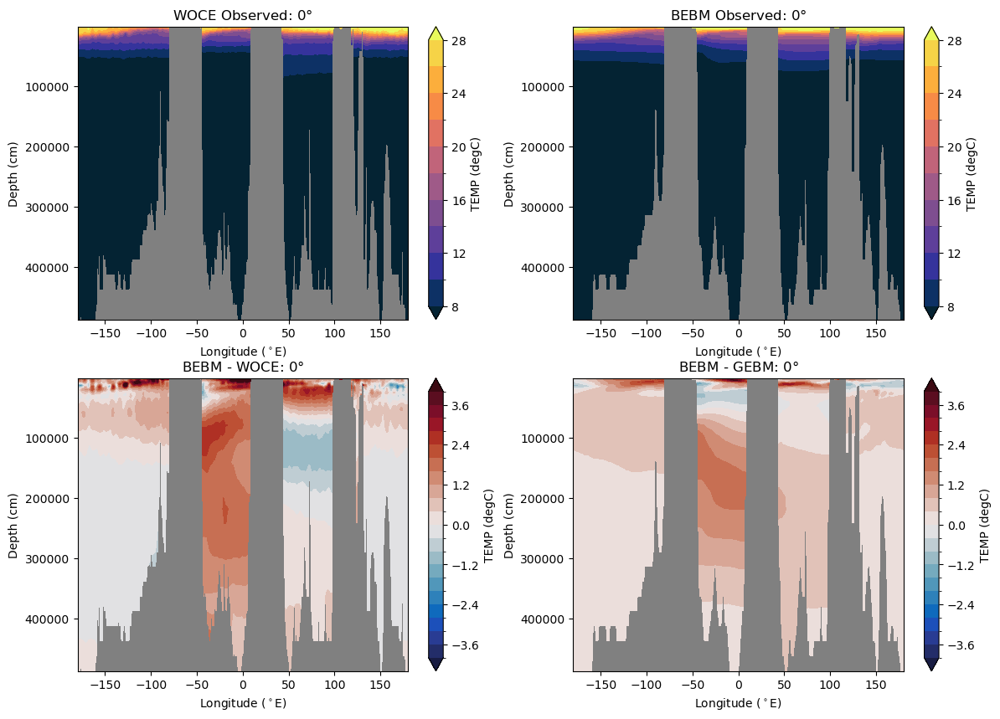

In [50]:
interactive_plot = interactive(depth_lon_section_bplot,
                               ovar=woce_vars,
                               gvar=cesm_vars,
                               lat=(-90,90,10),
                               lon1=(-180,180,10),
                               lon2=(-180,180,10),
                               d1=(0,600000,1000),
                               d2=(0,600000,1000),                               
                              )


output = interactive_plot.children[-1]
#output = interactive_plot.children
output.layout.height = '640px'
interactive_plot

In [51]:
woce_rg_glo.SALINITY.z_t

<xarray.DataArray 'z_t' (z_t: 60)> Size: 240B
array([5.000000e+02, 1.500000e+03, 2.500000e+03, 3.500000e+03, 4.500000e+03,
       5.500000e+03, 6.500000e+03, 7.500000e+03, 8.500000e+03, 9.500000e+03,
       1.050000e+04, 1.150000e+04, 1.250000e+04, 1.350000e+04, 1.450000e+04,
       1.550000e+04, 1.650984e+04, 1.754790e+04, 1.862913e+04, 1.976603e+04,
       2.097114e+04, 2.225783e+04, 2.364088e+04, 2.513702e+04, 2.676542e+04,
       2.854837e+04, 3.051192e+04, 3.268680e+04, 3.510935e+04, 3.782276e+04,
       4.087846e+04, 4.433777e+04, 4.827367e+04, 5.277280e+04, 5.793729e+04,
       6.388626e+04, 7.075633e+04, 7.870025e+04, 8.788252e+04, 9.847059e+04,
       1.106204e+05, 1.244567e+05, 1.400497e+05, 1.573946e+05, 1.764003e+05,
       1.968944e+05, 2.186457e+05, 2.413972e+05, 2.649001e+05, 2.889385e+05,
       3.133405e+05, 3.379793e+05, 3.627670e+05, 3.876452e+05, 4.125768e+05,
       4.375392e+05, 4.625190e+05, 4.875083e+05, 5.125028e+05, 5.375000e+05],
      dtype=float32)
Coordinates:
  * z_t      (z_t) float32 240B 500.0 1.5e+03 2.5e+03 ... 5.125e+05 5.375e+05

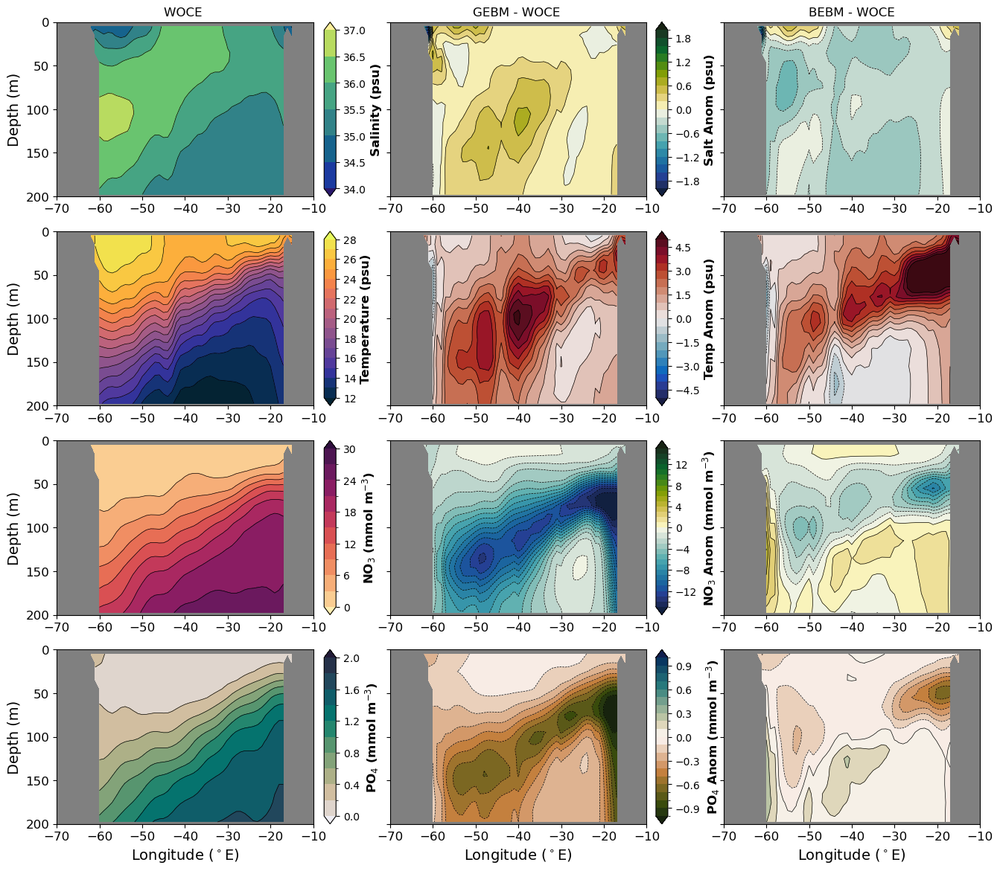

In [52]:
fig = plt.figure(figsize=(16,14))

def setscale(axx):
    #linear_piecewise_scale(dc*10, ds, ax = axx)
    # Rearange the yticks
    axx.set_yticks([0.0, 5000, 10000., 15000., 20000.]);
    axx.set_yticklabels(["0", "50", "100", "150", "200"]);
    #axx.axhline(50000, color='0.5', ls='--')

def setaxesfsize(axl,fontsize, xlabel, ylabel, labsize):
    ticklabelbot = axl.get_xticklabels()
    ticklabelleft = axl.get_yticklabels()
    for labelx in ticklabelbot:
        labelx.set_fontsize(fontsize)
#    i=0
    for labely in ticklabelleft:
#        if i != 0:
            labely.set_fontsize(fontsize)
    
    axl.set_xlabel(xlabel, size=labsize)
    axl.set_ylabel(ylabel, size=labsize)
    
def hide_yticks(axx):
    axx.yaxis.set_tick_params(labelleft=False)
    #axx.set_yticks([])


clev = np.linspace(-40,40,41)
alev = np.linspace(-4,4,41)

ax1 = plt.subplot(431)
ax2 = plt.subplot(432)
ax3 = plt.subplot(433)

ax4 = plt.subplot(434)
ax5 = plt.subplot(435)
ax6 = plt.subplot(436)

ax7 = plt.subplot(437)
ax8 = plt.subplot(438)
ax9 = plt.subplot(439)

ax10 = plt.subplot(4,3,10)
ax11 = plt.subplot(4,3,11)
ax12 = plt.subplot(4,3,12)

ax = [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8 ,ax9, ax10, ax11, ax12]

titlesize=14
axeslbfs=14
axesfs=12
cbarsx = 0.0015 # shift colorbars right a bit
cbar0 = 0.005
mapextent = [290, 360, -25, 25]

levstr = ""


lat=10.0
lon1=-70
lon2=-10
d1=0.
d2=20000.

# Salt
woce_salt = woce_rg_glo.SALINITY.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_salt = gebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt
bebm_woce_salt = bebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt

colmap = ocm.cm.haline
clevs = np.linspace(34,37,7)

p1 = woce_salt.plot.contourf(ax = ax1, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p1_0 = woce_salt.plot.contour(ax = ax1, levels = clevs, colors='k', linewidths=0.5)
ax1.set_title("WOCE " + levstr)
cbstr="Salinity (psu)"
call_vert_cbar(fig, ax1, cbarsx-cbar0, 0.0, p1, cbstr, width=0.01)

# Differences salt
dcolmap = ocm.cm.delta
dlevs = np.linspace(-2,2,21)

p2 = gebm_woce_salt.plot.contourf(ax = ax2, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p2_0 = gebm_woce_salt.plot.contour(ax = ax2, levels = dlevs, colors='k', linewidths=0.5)
ax2.set_title("GEBM - WOCE " + levstr)
cbstr="Salt Anom (psu)"
call_vert_cbar(fig, ax2, cbarsx, 0.0, p2, cbstr, width=0.01)

p3 = bebm_woce_salt.plot.contourf(ax = ax3, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p3_0 = bebm_woce_salt.plot.contour(ax = ax3, levels = dlevs, colors='k', linewidths=0.5)
ax3.set_title("BEBM - WOCE " + levstr)

# temp

woce_temp = woce_rg_glo.TPOTEN.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_temp = gebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_temp
bebm_woce_temp = bebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_temp

colmap = ocm.cm.thermal
clevs = np.linspace(12,28,17)

p4 = woce_temp.plot.contourf(ax = ax4, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p4_0 = woce_temp.plot.contour(ax = ax4, levels = clevs, colors='k', linewidths=0.5)
ax4.set_title("WOCE " + levstr)
cbstr="Temperature (psu)"
call_vert_cbar(fig, ax4, cbarsx-cbar0, 0.0, p4, cbstr, width=0.01)

# Differences temp
dcolmap = ocm.cm.balance
dlevs = np.linspace(-5,5,21)

p5 = gebm_woce_temp.plot.contourf(ax = ax5, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p5_0 = gebm_woce_temp.plot.contour(ax = ax5, levels = dlevs, colors='k', linewidths=0.5)
ax5.set_title("GEBM - WOCE " + levstr)
cbstr="Temp Anom (psu)"
call_vert_cbar(fig, ax5, cbarsx, 0.0, p5, cbstr, width=0.01)

p6 = bebm_woce_temp.plot.contourf(ax = ax6, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p6_0 = bebm_woce_temp.plot.contour(ax = ax6, levels = dlevs, colors='k', linewidths=0.5)
ax6.set_title("BEBM - WOCE " + levstr)

# Nitrate
woce_no3 = woce_rg_glo.NITRATE.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_no3 = gebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_no3
bebm_woce_no3 = bebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_no3

colmap = ocm.cm.matter
clevs = np.linspace(0,30,11)

p7 = woce_no3.plot.contourf(ax = ax7, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p7_0 = woce_no3.plot.contour(ax = ax7, levels = clevs, colors='k', linewidths=0.5)
ax7.set_title("WOCE " + levstr)
cbstr="NO$_3$ (mmol m$^{-3}$)"
call_vert_cbar(fig, ax7, cbarsx-cbar0, 0.0, p7, cbstr, width=0.01)

# Differences Nitrate
dcolmap = ocm.cm.delta
dlevs = np.linspace(-15,15,31)

p8 = gebm_woce_no3.plot.contourf(ax = ax8, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p8_0 = gebm_woce_no3.plot.contour(ax = ax8, levels = dlevs, colors='k', linewidths=0.5)
ax8.set_title("GEBM - WOCE " + levstr)
cbstr="NO$_3$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax8, cbarsx, 0.0, p8, cbstr, width=0.01)

p9 = bebm_woce_no3.plot.contourf(ax = ax9, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p9_0 = bebm_woce_no3.plot.contour(ax = ax9, levels = dlevs, colors='k', linewidths=0.5)
ax9.set_title("BEBM - WOCE " + levstr)

# phosphate
woce_po4 = woce_rg_glo.PHOSPH.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_po4 = gebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_po4
bebm_woce_po4 = bebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_po4

colmap=ocm.cm.rain
clevs=np.linspace(0,2, 11)

p10 = woce_po4.plot.contourf(ax = ax10, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p10_0 = woce_po4.plot.contour(ax = ax10, levels = clevs, colors='k', linewidths=0.5)
ax10.set_title("WOCE " + levstr)
cbstr="PO$_4$ (mmol m$^{-3}$)"
call_vert_cbar(fig, ax10, cbarsx-cbar0, 0.0, p10, cbstr, width=0.01)

# Differences phosphate
dcolmap=ocm.cm.reg_map
dlevs=np.linspace(-1,1,21)

p11 = gebm_woce_po4.plot.contourf(ax = ax11, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p11_0 = gebm_woce_po4.plot.contour(ax = ax11, levels = dlevs, colors='k', linewidths=0.5)
ax11.set_title("GEBM - WOCE " + levstr)
cbstr="PO$_4$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax11, cbarsx, 0.0, p11, cbstr, width=0.01)

p12 = bebm_woce_po4.plot.contourf(ax = ax12, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p12_0 = bebm_woce_po4.plot.contour(ax = ax12, levels = dlevs, colors='k', linewidths=0.5)
ax12.set_title("BEBM - WOCE " + levstr)

for i in range(0,12):
    ax[i].set_facecolor('grey')
    ax[i].invert_yaxis()
    setscale(ax[i])
    setaxesfsize(ax[i],12, "", "", 14)
    #ax[i].grid()
    ax[i].set_title("")

#ax.set(xlabel='Longitude ($^\circ$E)', ylabel='Depth (cm)')
#setaxesfsize(ax[i],12, "Longitude ($^\circ$E)", "Depth (m)", 14)
setaxesfsize(ax[0],12, "", "Depth (m)", 14)
setaxesfsize(ax[3],12, "", "Depth (m)", 14)
setaxesfsize(ax[6],12, "", "Depth (m)", 14)
setaxesfsize(ax[9],12, "Longitude ($^\circ$E)", "Depth (m)", 14)
setaxesfsize(ax[10],12, "Longitude ($^\circ$E)", "", 14)
setaxesfsize(ax[11],12, "Longitude ($^\circ$E)", "", 14)
# hide yticks on some plots
hide_yticks(ax[1])
hide_yticks(ax[2])
hide_yticks(ax[4])
hide_yticks(ax[5])
hide_yticks(ax[7])
hide_yticks(ax[8])
hide_yticks(ax[10])
hide_yticks(ax[11])

ax1.set_title("WOCE " + levstr)
ax2.set_title("GEBM - WOCE " + levstr)
ax3.set_title("BEBM - WOCE" + levstr)


plt.subplots_adjust(wspace=0.3)

icepaperdir="/home/guido/Dropbox/plots/estuaries/"
saveplot=False

if saveplot:
    plt.savefig(icepaperdir+"Figure_Amazon_10N_cross_section.png", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)
    plt.savefig(icepaperdir+"Figure_Amazon_10N_cross_section.pdf", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)



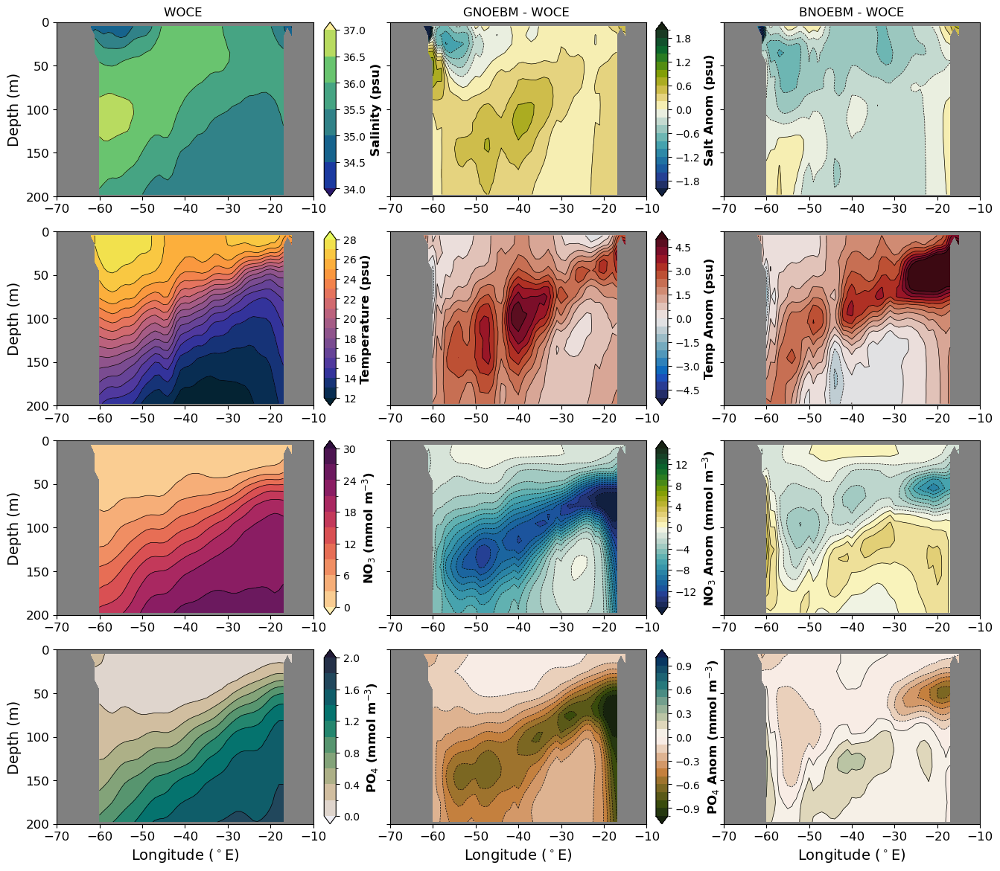

In [53]:
fig = plt.figure(figsize=(16,14))

def setscale(axx):
    #linear_piecewise_scale(dc*10, ds, ax = axx)
    # Rearange the yticks
    axx.set_yticks([0.0, 5000, 10000., 15000., 20000.]);
    axx.set_yticklabels(["0", "50", "100", "150", "200"]);
    #axx.axhline(50000, color='0.5', ls='--')

def setaxesfsize(axl,fontsize, xlabel, ylabel, labsize):
    ticklabelbot = axl.get_xticklabels()
    ticklabelleft = axl.get_yticklabels()
    for labelx in ticklabelbot:
        labelx.set_fontsize(fontsize)
#    i=0
    for labely in ticklabelleft:
#        if i != 0:
            labely.set_fontsize(fontsize)
    
    axl.set_xlabel(xlabel, size=labsize)
    axl.set_ylabel(ylabel, size=labsize)
    
def hide_yticks(axx):
    axx.yaxis.set_tick_params(labelleft=False)
    #axx.set_yticks([])


clev = np.linspace(-40,40,41)
alev = np.linspace(-4,4,41)

ax1 = plt.subplot(431)
ax2 = plt.subplot(432)
ax3 = plt.subplot(433)

ax4 = plt.subplot(434)
ax5 = plt.subplot(435)
ax6 = plt.subplot(436)

ax7 = plt.subplot(437)
ax8 = plt.subplot(438)
ax9 = plt.subplot(439)

ax10 = plt.subplot(4,3,10)
ax11 = plt.subplot(4,3,11)
ax12 = plt.subplot(4,3,12)

ax = [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8 ,ax9, ax10, ax11, ax12]

titlesize=14
axeslbfs=14
axesfs=12
cbarsx = 0.0015 # shift colorbars right a bit
cbar0 = 0.005
mapextent = [290, 360, -25, 25]

levstr = ""


lat=10.0
lon1=-70
lon2=-10
d1=0.
d2=20000.

# Salt
woce_salt = woce_rg_glo.SALINITY.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_salt = gnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt
bebm_woce_salt = bnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt

colmap = ocm.cm.haline
clevs = np.linspace(34,37,7)

p1 = woce_salt.plot.contourf(ax = ax1, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p1_0 = woce_salt.plot.contour(ax = ax1, levels = clevs, colors='k', linewidths=0.5)
ax1.set_title("WOCE " + levstr)
cbstr="Salinity (psu)"
call_vert_cbar(fig, ax1, cbarsx-cbar0, 0.0, p1, cbstr, width=0.01)

# Differences salt
dcolmap = ocm.cm.delta
dlevs = np.linspace(-2,2,21)

p2 = gebm_woce_salt.plot.contourf(ax = ax2, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p2_0 = gebm_woce_salt.plot.contour(ax = ax2, levels = dlevs, colors='k', linewidths=0.5)
ax2.set_title("GNOEBM - WOCE " + levstr)
cbstr="Salt Anom (psu)"
call_vert_cbar(fig, ax2, cbarsx, 0.0, p2, cbstr, width=0.01)

p3 = bebm_woce_salt.plot.contourf(ax = ax3, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p3_0 = bebm_woce_salt.plot.contour(ax = ax3, levels = dlevs, colors='k', linewidths=0.5)
ax3.set_title("BNOEBM - WOCE " + levstr)

# temp

woce_temp = woce_rg_glo.TPOTEN.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_temp = gnoebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_temp
bebm_woce_temp = bnoebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_temp

colmap = ocm.cm.thermal
clevs = np.linspace(12,28,17)

p4 = woce_temp.plot.contourf(ax = ax4, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p4_0 = woce_temp.plot.contour(ax = ax4, levels = clevs, colors='k', linewidths=0.5)
ax4.set_title("WOCE " + levstr)
cbstr="Temperature (psu)"
call_vert_cbar(fig, ax4, cbarsx-cbar0, 0.0, p4, cbstr, width=0.01)

# Differences temp
dcolmap = ocm.cm.balance
dlevs = np.linspace(-5,5,21)

p5 = gebm_woce_temp.plot.contourf(ax = ax5, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p5_0 = gebm_woce_temp.plot.contour(ax = ax5, levels = dlevs, colors='k', linewidths=0.5)
ax5.set_title("GNOEBM - WOCE " + levstr)
cbstr="Temp Anom (psu)"
call_vert_cbar(fig, ax5, cbarsx, 0.0, p5, cbstr, width=0.01)

p6 = bebm_woce_temp.plot.contourf(ax = ax6, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p6_0 = bebm_woce_temp.plot.contour(ax = ax6, levels = dlevs, colors='k', linewidths=0.5)
ax6.set_title("BNOEBM - WOCE " + levstr)

# Nitrate
woce_no3 = woce_rg_glo.NITRATE.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_no3 = gnoebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_no3
bebm_woce_no3 = bnoebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_no3

colmap = ocm.cm.matter
clevs = np.linspace(0,30,11)

p7 = woce_no3.plot.contourf(ax = ax7, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p7_0 = woce_no3.plot.contour(ax = ax7, levels = clevs, colors='k', linewidths=0.5)
ax7.set_title("WOCE " + levstr)
cbstr="NO$_3$ (mmol m$^{-3}$)"
call_vert_cbar(fig, ax7, cbarsx-cbar0, 0.0, p7, cbstr, width=0.01)

# Differences Nitrate
dcolmap = ocm.cm.delta
dlevs = np.linspace(-15,15,31)

p8 = gebm_woce_no3.plot.contourf(ax = ax8, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p8_0 = gebm_woce_no3.plot.contour(ax = ax8, levels = dlevs, colors='k', linewidths=0.5)
ax8.set_title("GNOEBM - WOCE " + levstr)
cbstr="NO$_3$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax8, cbarsx, 0.0, p8, cbstr, width=0.01)

p9 = bebm_woce_no3.plot.contourf(ax = ax9, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p9_0 = bebm_woce_no3.plot.contour(ax = ax9, levels = dlevs, colors='k', linewidths=0.5)
ax9.set_title("BNOEBM - WOCE " + levstr)

# phosphate
woce_po4 = woce_rg_glo.PHOSPH.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_po4 = gnoebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_po4
bebm_woce_po4 = bnoebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_po4

colmap=ocm.cm.rain
clevs=np.linspace(0,2, 11)

p10 = woce_po4.plot.contourf(ax = ax10, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p10_0 = woce_po4.plot.contour(ax = ax10, levels = clevs, colors='k', linewidths=0.5)
ax10.set_title("WOCE " + levstr)
cbstr="PO$_4$ (mmol m$^{-3}$)"
call_vert_cbar(fig, ax10, cbarsx-cbar0, 0.0, p10, cbstr, width=0.01)

# Differences phosphate
dcolmap=ocm.cm.reg_map
dlevs=np.linspace(-1,1,21)

p11 = gebm_woce_po4.plot.contourf(ax = ax11, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p11_0 = gebm_woce_po4.plot.contour(ax = ax11, levels = dlevs, colors='k', linewidths=0.5)
ax11.set_title("GNOEBM - WOCE " + levstr)
cbstr="PO$_4$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax11, cbarsx, 0.0, p11, cbstr, width=0.01)

p12 = bebm_woce_po4.plot.contourf(ax = ax12, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p12_0 = bebm_woce_po4.plot.contour(ax = ax12, levels = dlevs, colors='k', linewidths=0.5)
ax12.set_title("BNOEBM - WOCE " + levstr)

for i in range(0,12):
    ax[i].set_facecolor('grey')
    ax[i].invert_yaxis()
    setscale(ax[i])
    setaxesfsize(ax[i],12, "", "", 14)
    #ax[i].grid()
    ax[i].set_title("")

#ax.set(xlabel='Longitude ($^\circ$E)', ylabel='Depth (cm)')
#setaxesfsize(ax[i],12, "Longitude ($^\circ$E)", "Depth (m)", 14)
setaxesfsize(ax[0],12, "", "Depth (m)", 14)
setaxesfsize(ax[3],12, "", "Depth (m)", 14)
setaxesfsize(ax[6],12, "", "Depth (m)", 14)
setaxesfsize(ax[9],12, "Longitude ($^\circ$E)", "Depth (m)", 14)
setaxesfsize(ax[10],12, "Longitude ($^\circ$E)", "", 14)
setaxesfsize(ax[11],12, "Longitude ($^\circ$E)", "", 14)
# hide yticks on some plots
hide_yticks(ax[1])
hide_yticks(ax[2])
hide_yticks(ax[4])
hide_yticks(ax[5])
hide_yticks(ax[7])
hide_yticks(ax[8])
hide_yticks(ax[10])
hide_yticks(ax[11])

ax1.set_title("WOCE " + levstr)
ax2.set_title("GNOEBM - WOCE " + levstr)
ax3.set_title("BNOEBM - WOCE" + levstr)



plt.subplots_adjust(wspace=0.3)

icepaperdir="/home/guido/Dropbox/plots/estuaries/"
saveplot=False

if saveplot:
    plt.savefig(icepaperdir+"Figure_Amazon_10N_cross_section_noebm.png", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)
    plt.savefig(icepaperdir+"Figure_Amazon_10N_cross_section_noebm.pdf", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)



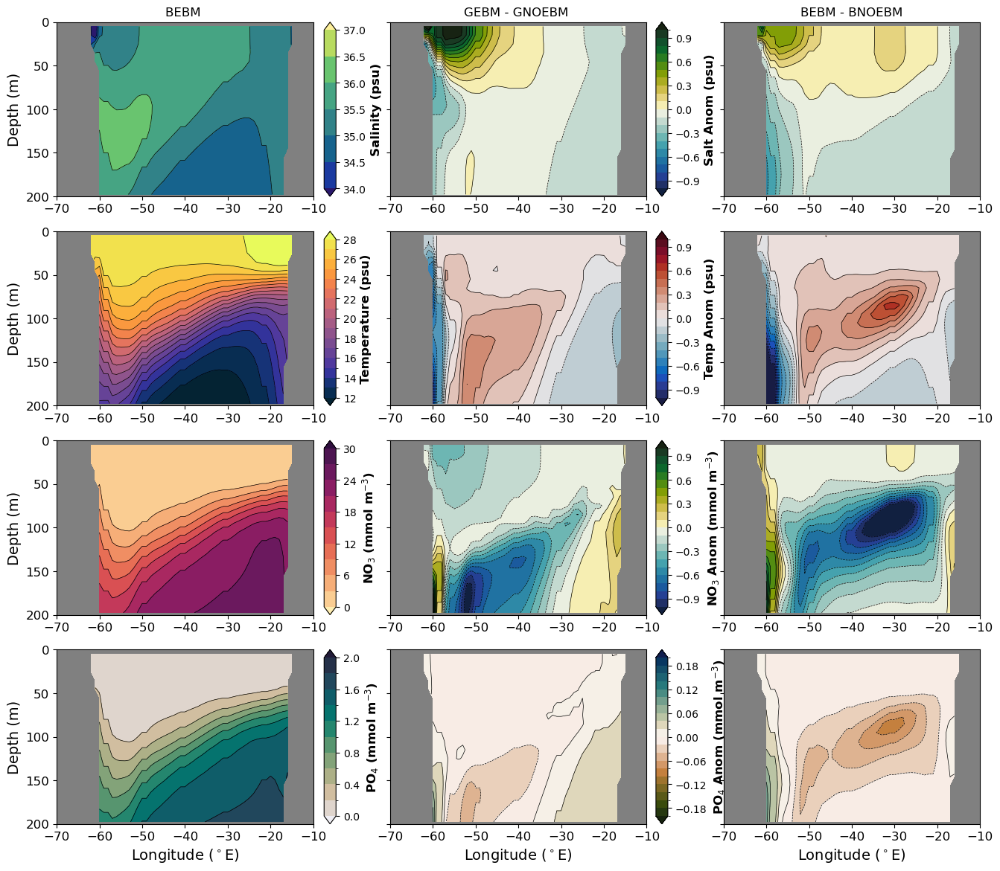

In [54]:
fig = plt.figure(figsize=(16,14))

def setscale(axx):
    #linear_piecewise_scale(dc*10, ds, ax = axx)
    # Rearange the yticks
    axx.set_yticks([0.0, 5000, 10000., 15000., 20000.]);
    axx.set_yticklabels(["0", "50", "100", "150", "200"]);
    #axx.axhline(50000, color='0.5', ls='--')

def setaxesfsize(axl,fontsize, xlabel, ylabel, labsize):
    ticklabelbot = axl.get_xticklabels()
    ticklabelleft = axl.get_yticklabels()
    for labelx in ticklabelbot:
        labelx.set_fontsize(fontsize)
#    i=0
    for labely in ticklabelleft:
#        if i != 0:
            labely.set_fontsize(fontsize)
    
    axl.set_xlabel(xlabel, size=labsize)
    axl.set_ylabel(ylabel, size=labsize)
    
def hide_yticks(axx):
    axx.yaxis.set_tick_params(labelleft=False)
    #axx.set_yticks([])


clev = np.linspace(-40,40,41)
alev = np.linspace(-4,4,41)

ax1 = plt.subplot(431)
ax2 = plt.subplot(432)
ax3 = plt.subplot(433)

ax4 = plt.subplot(434)
ax5 = plt.subplot(435)
ax6 = plt.subplot(436)

ax7 = plt.subplot(437)
ax8 = plt.subplot(438)
ax9 = plt.subplot(439)

ax10 = plt.subplot(4,3,10)
ax11 = plt.subplot(4,3,11)
ax12 = plt.subplot(4,3,12)

ax = [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8 ,ax9, ax10, ax11, ax12]

titlesize=14
axeslbfs=14
axesfs=12
cbarsx = 0.0015 # shift colorbars right a bit
cbar0 = 0.005
mapextent = [290, 360, -25, 25]

levstr = ""


lat=10.0
lon1=-70
lon2=-10
d1=0.
d2=20000.

# Salt
gnoebm_salt = gnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bnoebm_salt = bnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_salt = gebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bebm_salt = bebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_gnoebm_salt = gebm_salt - gnoebm_salt
bebm_gnoebm_salt = bebm_salt - bnoebm_salt

colmap = ocm.cm.haline
clevs = np.linspace(34,37,7)

p1 = bebm_salt.plot.contourf(ax = ax1, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p1_0 = bebm_salt.plot.contour(ax = ax1, levels = clevs, colors='k', linewidths=0.5)
cbstr="Salinity (psu)"
call_vert_cbar(fig, ax1, cbarsx-cbar0, 0.0, p1, cbstr, width=0.01)

# Differences salt
dcolmap = ocm.cm.delta
dlevs = np.linspace(-1,1,21)

p2 = gebm_gnoebm_salt.plot.contourf(ax = ax2, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p2_0 = gebm_gnoebm_salt.plot.contour(ax = ax2, levels = dlevs, colors='k', linewidths=0.5)
ax2.set_title("GNOEBM - WOCE " + levstr)
cbstr="Salt Anom (psu)"
call_vert_cbar(fig, ax2, cbarsx, 0.0, p2, cbstr, width=0.01)

p3 = bebm_gnoebm_salt.plot.contourf(ax = ax3, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p3_0 = bebm_gnoebm_salt.plot.contour(ax = ax3, levels = dlevs, colors='k', linewidths=0.5)
ax3.set_title("BNOEBM - WOCE " + levstr)

# temp

gnoebm_temp = gnoebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bnoebm_temp = bnoebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_temp = gebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bebm_temp = bebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_gnoebm_temp = gebm_temp - gnoebm_temp
bebm_gnoebm_temp = bebm_temp - bnoebm_temp

colmap = ocm.cm.thermal
clevs = np.linspace(12,28,17)

p4 = bebm_temp.plot.contourf(ax = ax4, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p4_0 = bebm_temp.plot.contour(ax = ax4, levels = clevs, colors='k', linewidths=0.5)
ax4.set_title("BEBM " + levstr)
cbstr="Temperature (psu)"
call_vert_cbar(fig, ax4, cbarsx-cbar0, 0.0, p4, cbstr, width=0.01)

# Differences temp
dcolmap = ocm.cm.balance
dlevs = np.linspace(-1,1,21)

p5 = gebm_gnoebm_temp.plot.contourf(ax = ax5, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p5_0 = gebm_gnoebm_temp.plot.contour(ax = ax5, levels = dlevs, colors='k', linewidths=0.5)
ax5.set_title("GNOEBM - WOCE " + levstr)
cbstr="Temp Anom (psu)"
call_vert_cbar(fig, ax5, cbarsx, 0.0, p5, cbstr, width=0.01)

p6 = bebm_gnoebm_temp.plot.contourf(ax = ax6, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p6_0 = bebm_gnoebm_temp.plot.contour(ax = ax6, levels = dlevs, colors='k', linewidths=0.5)
ax6.set_title("BNOEBM - WOCE " + levstr)

# Nitrate
gnoebm_no3 = gnoebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bnoebm_no3 = bnoebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_no3 = gebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bebm_no3 = bebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_gnoebm_no3 = gebm_no3 - gnoebm_no3
bebm_gnoebm_no3 = bebm_no3 - bnoebm_no3

colmap = ocm.cm.matter
clevs = np.linspace(0,30,11)

p7 = bebm_no3.plot.contourf(ax = ax7, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p7_0 = bebm_no3.plot.contour(ax = ax7, levels = clevs, colors='k', linewidths=0.5)
ax7.set_title("WOCE " + levstr)
cbstr="NO$_3$ (mmol m$^{-3}$)"
call_vert_cbar(fig, ax7, cbarsx-cbar0, 0.0, p7, cbstr, width=0.01)

# Differences Nitrate
dcolmap = ocm.cm.delta
dlevs = np.linspace(-1,1,21)

p8 = gebm_gnoebm_no3.plot.contourf(ax = ax8, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p8_0 = gebm_gnoebm_no3.plot.contour(ax = ax8, levels = dlevs, colors='k', linewidths=0.5)
ax8.set_title("GNOEBM - WOCE " + levstr)
cbstr="NO$_3$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax8, cbarsx, 0.0, p8, cbstr, width=0.01)

p9 = bebm_gnoebm_no3.plot.contourf(ax = ax9, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p9_0 = bebm_gnoebm_no3.plot.contour(ax = ax9, levels = dlevs, colors='k', linewidths=0.5)
ax9.set_title("BNOEBM - WOCE " + levstr)

# phosphate
gnoebm_po4 = gnoebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bnoebm_po4 = bnoebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_po4 = gebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bebm_po4 = bebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_gnoebm_po4 = gebm_po4 - gnoebm_po4
bebm_gnoebm_po4 = bebm_po4 - bnoebm_po4

colmap=ocm.cm.rain
clevs=np.linspace(0,2, 11)

p10 = bebm_po4.plot.contourf(ax = ax10, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p10_0 = bebm_po4.plot.contour(ax = ax10, levels = clevs, colors='k', linewidths=0.5)
ax10.set_title("WOCE " + levstr)
cbstr="PO$_4$ (mmol m$^{-3}$)"
call_vert_cbar(fig, ax10, cbarsx-cbar0, 0.0, p10, cbstr, width=0.01)

# Differences phosphate
dcolmap=ocm.cm.reg_map
dlevs=np.linspace(-.2,.2,21)

p11 = gebm_gnoebm_po4.plot.contourf(ax = ax11, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p11_0 = gebm_gnoebm_po4.plot.contour(ax = ax11, levels = dlevs, colors='k', linewidths=0.5)
ax11.set_title("GEBM - GNOEBM " + levstr)
cbstr="PO$_4$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax11, cbarsx, 0.0, p11, cbstr, width=0.01)

p12 = bebm_gnoebm_po4.plot.contourf(ax = ax12, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p12_0 = bebm_gnoebm_po4.plot.contour(ax = ax12, levels = dlevs, colors='k', linewidths=0.5)
ax12.set_title("BEBM - BNOEBM " + levstr)

for i in range(0,12):
    ax[i].set_facecolor('grey')
    ax[i].invert_yaxis()
    setscale(ax[i])
    setaxesfsize(ax[i],12, "", "", 14)
    #ax[i].grid()
    ax[i].set_title("")

#ax.set(xlabel='Longitude ($^\circ$E)', ylabel='Depth (cm)')
#setaxesfsize(ax[i],12, "Longitude ($^\circ$E)", "Depth (m)", 14)
setaxesfsize(ax[0],12, "", "Depth (m)", 14)
setaxesfsize(ax[3],12, "", "Depth (m)", 14)
setaxesfsize(ax[6],12, "", "Depth (m)", 14)
setaxesfsize(ax[9],12, "Longitude ($^\circ$E)", "Depth (m)", 14)
setaxesfsize(ax[10],12, "Longitude ($^\circ$E)", "", 14)
setaxesfsize(ax[11],12, "Longitude ($^\circ$E)", "", 14)
# hide yticks on some plots
hide_yticks(ax[1])
hide_yticks(ax[2])
hide_yticks(ax[4])
hide_yticks(ax[5])
hide_yticks(ax[7])
hide_yticks(ax[8])
hide_yticks(ax[10])
hide_yticks(ax[11])

ax1.set_title("BEBM " + levstr)
ax2.set_title("GEBM - GNOEBM " + levstr)
ax3.set_title("BEBM - BNOEBM" + levstr)


plt.subplots_adjust(wspace=0.3)

icepaperdir="/home/guido/Dropbox/plots/estuaries/"
saveplot=False

if saveplot:
    plt.savefig(icepaperdir+"Figure_Amazon_10N_cross_section_ebm_noebm.png", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)
    plt.savefig(icepaperdir+"Figure_Amazon_10N_cross_section_ebm_noebm.pdf", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)



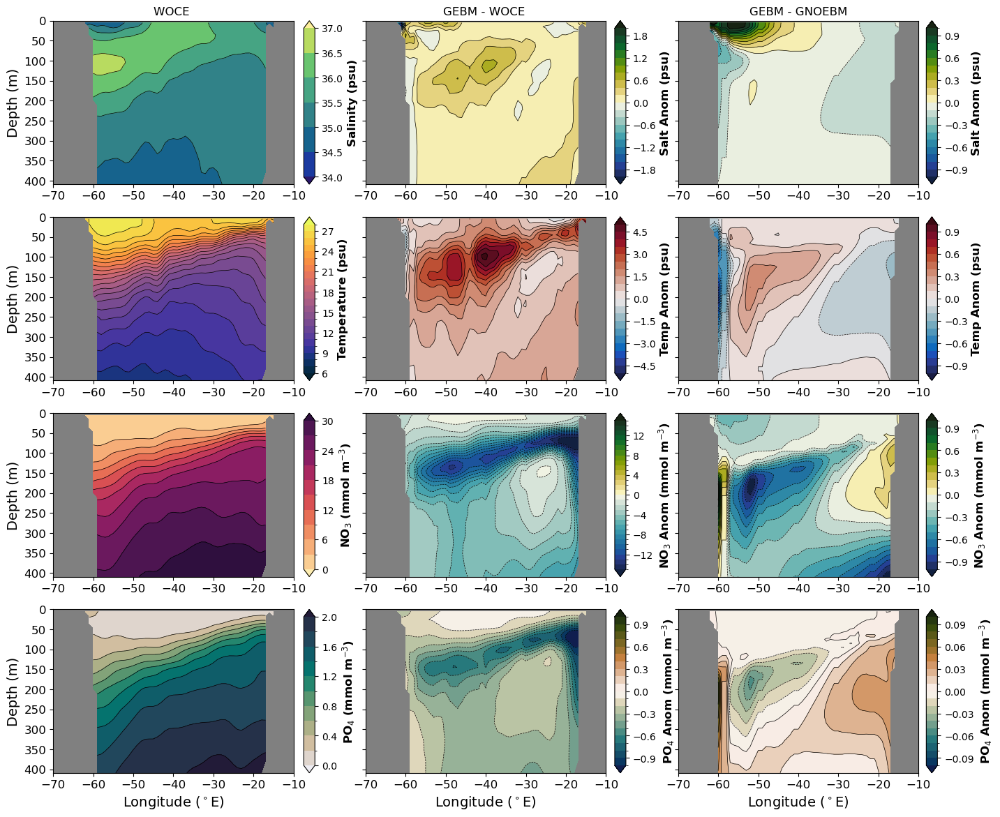

In [55]:
fig = plt.figure(figsize=(16,14))

def setscale(axx):
    #linear_piecewise_scale(dc*10, ds, ax = axx)
    # Rearange the yticks
    #axx.set_yticks([0.0, 5000, 10000., 15000., 20000.]);
    #axx.set_yticklabels(["0", "50", "100", "150", "200"]);
    axx.set_yticks([0.0, 5000, 10000., 15000., 20000., 25000., 30000., 35000., 40000.]);
    axx.set_yticklabels(["0", "50", "100", "150", "200", "250", "300", "350", "400"]);
    #axx.axhline(50000, color='0.5', ls='--')

def setaxesfsize(axl,fontsize, xlabel, ylabel, labsize):
    ticklabelbot = axl.get_xticklabels()
    ticklabelleft = axl.get_yticklabels()
    for labelx in ticklabelbot:
        labelx.set_fontsize(fontsize)
#    i=0
    for labely in ticklabelleft:
#        if i != 0:
            labely.set_fontsize(fontsize)
    
    axl.set_xlabel(xlabel, size=labsize)
    axl.set_ylabel(ylabel, size=labsize)
    
def hide_yticks(axx):
    axx.yaxis.set_tick_params(labelleft=False)
    #axx.set_yticks([])


clev = np.linspace(-40,40,41)
alev = np.linspace(-4,4,41)

ax1 = plt.subplot(431)
ax2 = plt.subplot(432)
ax3 = plt.subplot(433)

ax4 = plt.subplot(434)
ax5 = plt.subplot(435)
ax6 = plt.subplot(436)

ax7 = plt.subplot(437)
ax8 = plt.subplot(438)
ax9 = plt.subplot(439)

ax10 = plt.subplot(4,3,10)
ax11 = plt.subplot(4,3,11)
ax12 = plt.subplot(4,3,12)

ax = [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8 ,ax9, ax10, ax11, ax12]

titlesize=14
axeslbfs=14
axesfs=12
cbarsx = 0.0015 # shift colorbars right a bit
cbarsx_r = 0.007 # shift colorbars right a bit
cbar0 = 0.005
mapextent = [290, 360, -25, 25]

levstr = ""


lat=10.0
lon1=-70
lon2=-10
d1=0.
d2=42000.

# Salt
woce_salt = woce_rg_glo.SALINITY.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_salt = gebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt
bebm_woce_salt = bebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt
gnoebm_salt = gnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bnoebm_salt = bnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_salt = gebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bebm_salt = bebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_gnoebm_salt = gebm_salt - gnoebm_salt
bebm_gnoebm_salt = bebm_salt - bnoebm_salt

colmap = ocm.cm.haline
clevs = np.linspace(34,37,7)

p1 = woce_salt.plot.contourf(ax = ax1, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p1_0 = woce_salt.plot.contour(ax = ax1, levels = clevs, colors='k', linewidths=0.5)
ax1.set_title("WOCE " + levstr)
cbstr="Salinity (psu)"
call_vert_cbar(fig, ax1, cbarsx-cbar0, 0.0, p1, cbstr, width=0.01)

# Differences salt
dcolmap = ocm.cm.delta
dlevs = np.linspace(-2,2,21)

p2 = gebm_woce_salt.plot.contourf(ax = ax2, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p2_0 = gebm_woce_salt.plot.contour(ax = ax2, levels = dlevs, colors='k', linewidths=0.5)
ax2.set_title("GEBM - WOCE " + levstr)
cbstr="Salt Anom (psu)"
call_vert_cbar(fig, ax2, cbarsx, 0.0, p2, cbstr, width=0.01)

# Differences ebm-noebm
dcolmap = ocm.cm.delta
dlevs = np.linspace(-1,1,21)

p3 = gebm_gnoebm_salt.plot.contourf(ax = ax3, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p3_0 = gebm_gnoebm_salt.plot.contour(ax = ax3, levels = dlevs, colors='k', linewidths=0.5)
ax3.set_title("GEBM - GNOEBM " + levstr)
cbstr="Salt Anom (psu)"
call_vert_cbar(fig, ax3, cbarsx_r, 0.0, p3, cbstr, width=0.01)

# temp

woce_temp = woce_rg_glo.TPOTEN.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_temp = gebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_temp
bebm_woce_temp = bebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_temp
gnoebm_temp = gnoebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bnoebm_temp = bnoebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_temp = gebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bebm_temp = bebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_gnoebm_temp = gebm_temp - gnoebm_temp
bebm_gnoebm_temp = bebm_temp - bnoebm_temp

colmap = ocm.cm.thermal
clevs = np.linspace(6,28,23)

p4 = woce_temp.plot.contourf(ax = ax4, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p4_0 = woce_temp.plot.contour(ax = ax4, levels = clevs, colors='k', linewidths=0.5)
ax4.set_title("WOCE " + levstr)
cbstr="Temperature (psu)"
call_vert_cbar(fig, ax4, cbarsx-cbar0, 0.0, p4, cbstr, width=0.01)

# Differences temp
dcolmap = ocm.cm.balance
dlevs = np.linspace(-5,5,21)

p5 = gebm_woce_temp.plot.contourf(ax = ax5, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p5_0 = gebm_woce_temp.plot.contour(ax = ax5, levels = dlevs, colors='k', linewidths=0.5)
ax5.set_title("GEBM - WOCE " + levstr)
cbstr="Temp Anom (psu)"
call_vert_cbar(fig, ax5, cbarsx, 0.0, p5, cbstr, width=0.01)

# Differences ebm - noebm
dcolmap = ocm.cm.balance
dlevs = np.linspace(-1,1,21)

p6 = gebm_gnoebm_temp.plot.contourf(ax = ax6, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p6_0 = gebm_gnoebm_temp.plot.contour(ax = ax6, levels = dlevs, colors='k', linewidths=0.5)
ax6.set_title("GEBM - GNOEBM " + levstr)
cbstr="Temp Anom (psu)"
call_vert_cbar(fig, ax6, cbarsx_r, 0.0, p6, cbstr, width=0.01)

# Nitrate
woce_no3 = woce_rg_glo.NITRATE.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_no3 = gebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_no3
bebm_woce_no3 = bebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_no3
gnoebm_no3 = gnoebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bnoebm_no3 = bnoebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_no3 = gebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bebm_no3 = bebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_gnoebm_no3 = gebm_no3 - gnoebm_no3
bebm_gnoebm_no3 = bebm_no3 - bnoebm_no3

colmap = ocm.cm.matter
clevs = np.linspace(0,30,11)

p7 = woce_no3.plot.contourf(ax = ax7, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p7_0 = woce_no3.plot.contour(ax = ax7, levels = clevs, colors='k', linewidths=0.5)
ax7.set_title("WOCE " + levstr)
cbstr="NO$_3$ (mmol m$^{-3}$)"
call_vert_cbar(fig, ax7, cbarsx-cbar0, 0.0, p7, cbstr, width=0.01)

# Differences Nitrate
dcolmap = ocm.cm.delta
dlevs = np.linspace(-15,15,31)

p8 = gebm_woce_no3.plot.contourf(ax = ax8, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p8_0 = gebm_woce_no3.plot.contour(ax = ax8, levels = dlevs, colors='k', linewidths=0.5)
ax8.set_title("GEBM - WOCE " + levstr)
cbstr="NO$_3$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax8, cbarsx, 0.0, p8, cbstr, width=0.01)

# Differences ebm - noebm
dcolmap = ocm.cm.delta
dlevs = np.linspace(-1,1,21)

p9 = gebm_gnoebm_no3.plot.contourf(ax = ax9, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p9_0 = gebm_gnoebm_no3.plot.contour(ax = ax9, levels = dlevs, colors='k', linewidths=0.5)
ax9.set_title("GNOEBM - WOCE " + levstr)
cbstr="NO$_3$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax9, cbarsx_r, 0.0, p9, cbstr, width=0.01)

# phosphate
woce_po4 = woce_rg_glo.PHOSPH.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_po4 = gebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_po4
bebm_woce_po4 = bebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_po4
gnoebm_po4 = gnoebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bnoebm_po4 = bnoebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_po4 = gebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bebm_po4 = bebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_gnoebm_po4 = gebm_po4 - gnoebm_po4
bebm_gnoebm_po4 = bebm_po4 - bnoebm_po4

colmap=ocm.cm.rain
clevs=np.linspace(0,2, 11)

p10 = woce_po4.plot.contourf(ax = ax10, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p10_0 = woce_po4.plot.contour(ax = ax10, levels = clevs, colors='k', linewidths=0.5)
ax10.set_title("WOCE " + levstr)
cbstr="PO$_4$ (mmol m$^{-3}$)"
call_vert_cbar(fig, ax10, cbarsx-cbar0, 0.0, p10, cbstr, width=0.01)

# Differences phosphate
dcolmap=ocm.cm.reg_map_r
dlevs=np.linspace(-1,1,21)

p11 = gebm_woce_po4.plot.contourf(ax = ax11, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p11_0 = gebm_woce_po4.plot.contour(ax = ax11, levels = dlevs, colors='k', linewidths=0.5)
ax11.set_title("GEBM - WOCE " + levstr)
cbstr="PO$_4$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax11, cbarsx, 0.0, p11, cbstr, width=0.01)

# Differences phosphate
dcolmap=ocm.cm.reg_map_r
dlevs=np.linspace(-0.1,0.1,21)

p12 = gebm_gnoebm_po4.plot.contourf(ax = ax12, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p12_0 = gebm_gnoebm_po4.plot.contour(ax = ax12, levels = dlevs, colors='k', linewidths=0.5)
ax12.set_title("GEBM - GNOEBM " + levstr)
cbstr="PO$_4$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax12, cbarsx_r, 0.0, p12, cbstr, width=0.01)

for i in range(0,12):
    ax[i].set_facecolor('grey')
    ax[i].invert_yaxis()
    setscale(ax[i])
    setaxesfsize(ax[i],12, "", "", 14)
    #ax[i].grid()
    ax[i].set_title("")

#ax.set(xlabel='Longitude ($^\circ$E)', ylabel='Depth (cm)')
#setaxesfsize(ax[i],12, "Longitude ($^\circ$E)", "Depth (m)", 14)
setaxesfsize(ax[0],12, "", "Depth (m)", 14)
setaxesfsize(ax[3],12, "", "Depth (m)", 14)
setaxesfsize(ax[6],12, "", "Depth (m)", 14)
setaxesfsize(ax[9],12, "Longitude ($^\circ$E)", "Depth (m)", 14)
setaxesfsize(ax[10],12, "Longitude ($^\circ$E)", "", 14)
setaxesfsize(ax[11],12, "Longitude ($^\circ$E)", "", 14)
# hide yticks on some plots
hide_yticks(ax[1])
hide_yticks(ax[2])
hide_yticks(ax[4])
hide_yticks(ax[5])
hide_yticks(ax[7])
hide_yticks(ax[8])
hide_yticks(ax[10])
hide_yticks(ax[11])

ax1.set_title("WOCE " + levstr)
ax2.set_title("GEBM - WOCE " + levstr)
ax3.set_title("GEBM - GNOEBM" + levstr)


plt.subplots_adjust(wspace=0.3)

icepaperdir="/home/guido/Dropbox/plots/estuaries/"
saveplot=False

if saveplot:
    plt.savefig(icepaperdir+"Figure_Amazon_10N_cross_section_v1.png", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)
    plt.savefig(icepaperdir+"Figure_Amazon_10N_cross_section_v1.pdf", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)



In [56]:
def set_amazon_xygrid(ax, labelsize, xon=True, yon=True):
    # Set lat/lon grid # here the drawlabels seems to affect the xais
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=xon,
                      linewidth=0.1, color='k', alpha=1, 
                      linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.bot_labels = xon
    gl.left_labels = yon

    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': labelsize}
    gl.ylabel_style = {'size': labelsize}
    #gl.xlabel_style = dict(fontsize=labelsize)
    #gl.ylabel_style = dict(fontsize=labelsize, rotation=0, va='center', ha='center')

    gl.xlocator = mticker.FixedLocator([-60, -40, -20, 0])
    gl.ylocator = mticker.FixedLocator([-20, -10, 0, 10, 20])

    #mext = [290, 360, -25, 25]
    #xext = np.linspace(mext[0],mext[1],8)
    #print(xext)
    #gl.xlocator = mticker.FixedLocator(xext)
    #yext = np.linspace(mext[0],mext[-1],10)
    #gl.ylocator = mticker.FixedLocator([10, 20, 30, 40, 50])

    # Add map features with Cartopy 
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m', 
                                                edgecolor='face', 
                                                facecolor='gray'))
    ax.add_feature(cfeature.RIVERS)                                   
    ax.coastlines(linewidth=1)
    ax.set_facecolor("gray")

def hide_yticks(axx):
    axx.yaxis.set_tick_params(labelleft=False)
    #axx.set_yticks([])


209.71138671875


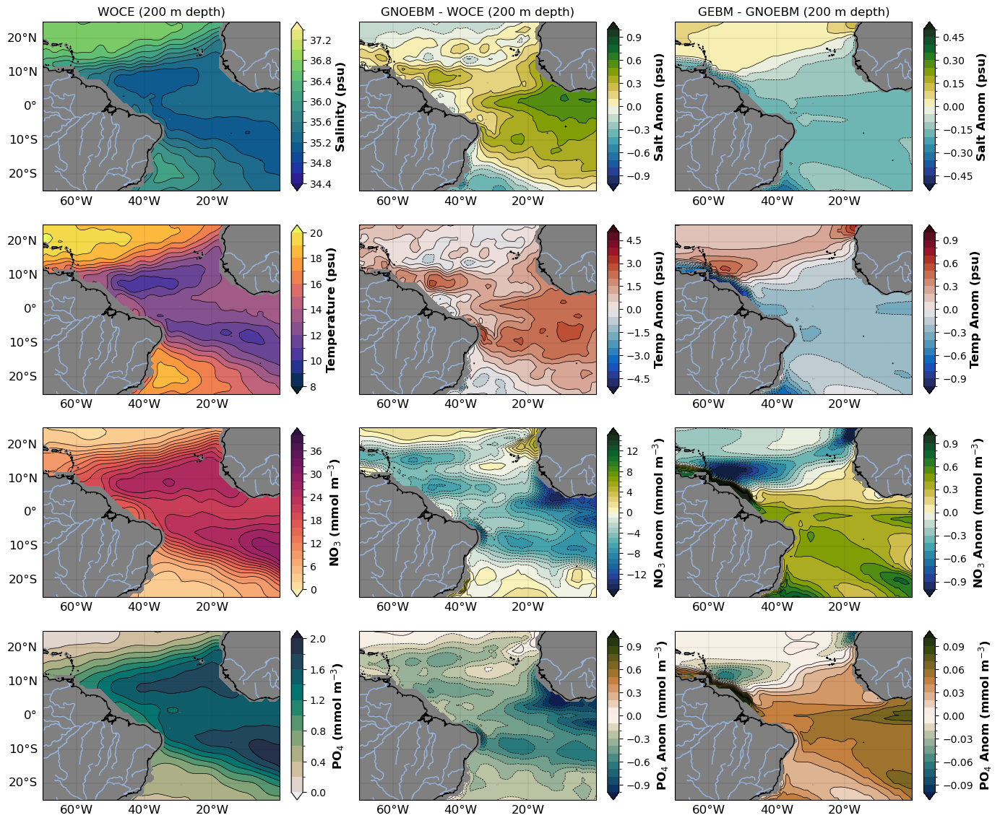

In [57]:
fig = plt.figure(figsize=(16,14))

colmap = ocm.cm.haline
acolmap = plt.cm.bwr

clev = np.linspace(-40,40,41)
alev = np.linspace(-4,4,41)

ax1 = plt.subplot(431,projection=ccrs.PlateCarree())
ax2 = plt.subplot(432,projection=ccrs.PlateCarree())
ax3 = plt.subplot(433,projection=ccrs.PlateCarree())

ax4 = plt.subplot(434,projection=ccrs.PlateCarree())
ax5 = plt.subplot(435,projection=ccrs.PlateCarree())
ax6 = plt.subplot(436,projection=ccrs.PlateCarree())

ax7 = plt.subplot(437,projection=ccrs.PlateCarree())
ax8 = plt.subplot(438,projection=ccrs.PlateCarree())
ax9 = plt.subplot(439,projection=ccrs.PlateCarree())

ax10 = plt.subplot(4,3,10,projection=ccrs.PlateCarree())
ax11 = plt.subplot(4,3,11,projection=ccrs.PlateCarree())
ax12 = plt.subplot(4,3,12,projection=ccrs.PlateCarree())

titlesize=14
axeslbfs=14
axesfs=12
cbarsx = 0.01 # shift colorbars right a bit
grid_ls = 12 # grid label size
mapextent = [290, 360, -25, 25]
zlev = 20
print(woce_rg_glo.z_t[zlev].values/100.)
levstr = "(200 m depth)"

# obs salt
colmap = ocm.cm.haline
clevs = np.linspace(34.4,37.4,16)

ax1.set_extent(mapextent, ccrs.PlateCarree())
p1 = woce_rg_glo.SALINITY[zlev,:,:].plot.contourf(ax = ax1, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p1_0 = woce_rg_glo.SALINITY[zlev,:,:].plot.contour(ax = ax1, levels = clevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax1, grid_ls, xon=True, yon=True)
ax1.set_title("WOCE " + levstr)
cbstr="Salinity (psu)"
call_vert_cbar(fig, ax1, cbarsx, 0.0, p1, cbstr, width=0.01)

# Differences salt
dcolmap = ocm.cm.delta
dlevs = np.linspace(-1,1,21)

ax2.set_extent(mapextent, ccrs.PlateCarree())
p2 = (gnoebm_SALT.SALT[zlev,:,:] - woce_rg_glo.SALINITY[zlev,:,:]).plot.contourf(ax = ax2, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p2_0 = (gnoebm_SALT.SALT[zlev,:,:] - woce_rg_glo.SALINITY[zlev,:,:]).plot.contour(ax = ax2, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax2, grid_ls, xon=True, yon=False)
ax2.set_title("GNOEBM - WOCE " + levstr)
cbstr="Salt Anom (psu)"
call_vert_cbar(fig, ax2, cbarsx, 0.0, p2, cbstr, width=0.01)

# Differences ebm-noebm
dcolmap = ocm.cm.delta
dlevs = np.linspace(-0.5,0.5,21)

ax3.set_extent(mapextent, ccrs.PlateCarree())
p3 = gdiff_SALT.SALT[zlev,:,:].plot.contourf(ax = ax3, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p3_0 = gdiff_SALT.SALT[zlev,:,:].plot.contour(ax = ax3, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax3, grid_ls, xon=True, yon=False)
ax3.set_title("GEBM - GNOEBM " + levstr)
call_vert_cbar(fig, ax3, cbarsx, 0.0, p3, cbstr, width=0.01)

# obs temp
colmap = ocm.cm.thermal
clevs = np.linspace(8,20,13)

ax4.set_extent(mapextent, ccrs.PlateCarree())
p4 = woce_rg_glo.TPOTEN[zlev,:,:].plot.contourf(ax = ax4, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p4_0 = woce_rg_glo.TPOTEN[zlev,:,:].plot.contour(ax = ax4, levels = clevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax4, grid_ls, xon=True, yon=True)
#ax4.set_title("WOCE " + levstr)
ax4.set_title("")
cbstr="Temperature (psu)"
call_vert_cbar(fig, ax4, cbarsx, 0.0, p4, cbstr, width=0.01)

# Differences temp
dcolmap = ocm.cm.balance
dlevs = np.linspace(-5,5,21)

ax5.set_extent(mapextent, ccrs.PlateCarree())
p5 = (gnoebm_TEMP.TEMP[zlev,:,:] - woce_rg_glo.TPOTEN[zlev,:,:]).plot.contourf(ax = ax5, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p5_0 = (gnoebm_TEMP.TEMP[zlev,:,:] - woce_rg_glo.TPOTEN[zlev,:,:]).plot.contour(ax = ax5, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax5, grid_ls, xon=True, yon=False)
#ax5.set_title("GNOEBM - WOCE " + levstr)
ax5.set_title("")
cbstr="Temp Anom (psu)"
call_vert_cbar(fig, ax5, cbarsx, 0.0, p5, cbstr, width=0.01)

# Differences ebm - noebm
dcolmap = ocm.cm.balance
dlevs = np.linspace(-1,1,21)

ax6.set_extent(mapextent, ccrs.PlateCarree())
p6 = gdiff_TEMP.TEMP[zlev,:,:].plot.contourf(ax = ax6, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p6_0 = gdiff_TEMP.TEMP[zlev,:,:].plot.contour(ax = ax6, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax6, grid_ls, xon=True, yon=False)
#ax6.set_title("GEBM - GNOEBM " + levstr)
ax6.set_title("")
call_vert_cbar(fig, ax6, cbarsx, 0.0, p6, cbstr, width=0.01)

# obs nitrate
colmap = ocm.cm.matter
clevs = np.linspace(0,40,21)

ax7.set_extent(mapextent, ccrs.PlateCarree())
p7 = woce_rg_glo.NITRATE[zlev,:,:].plot.contourf(ax = ax7, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p7_0 = woce_rg_glo.NITRATE[zlev,:,:].plot.contour(ax = ax7, levels = clevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax7, grid_ls, xon=True, yon=True)
#ax7.set_title("WOCE " + levstr)
ax7.set_title("")
cbstr="NO$_3$ (mmol m$^{-3}$)"
call_vert_cbar(fig, ax7, cbarsx, 0.0, p7, cbstr, width=0.01)

# Differences Nitrate
dcolmap = ocm.cm.delta
dlevs = np.linspace(-15,15,31)

ax8.set_extent(mapextent, ccrs.PlateCarree())
p8 = (gnoebm_NO3.NO3[zlev,:,:] - woce_rg_glo.NITRATE[zlev,:,:]).plot.contourf(ax = ax8, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p8_0 = (gnoebm_NO3.NO3[zlev,:,:] - woce_rg_glo.NITRATE[zlev,:,:]).plot.contour(ax = ax8, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax8, grid_ls, xon=True, yon=False)
#ax8.set_title("GNOEBM - WOCE " + levstr)
ax8.set_title("")
cbstr="NO$_3$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax8, cbarsx, 0.0, p8, cbstr, width=0.01)

# Differences ebm - noebm
dcolmap = ocm.cm.delta
dlevs = np.linspace(-1,1,21)

ax9.set_extent(mapextent, ccrs.PlateCarree())
p9 = gdiff_NO3.NO3[zlev,:,:].plot.contourf(ax = ax9, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p9_0 = gdiff_NO3.NO3[zlev,:,:].plot.contour(ax = ax9, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax9, grid_ls, xon=True, yon=False)
#ax9.set_title("GEBM - GNOEBM " + levstr)
ax9.set_title("")
call_vert_cbar(fig, ax9, cbarsx, 0.0, p9, cbstr, width=0.01)

# obs phosphate
colmap=ocm.cm.rain
clevs=np.linspace(0,2, 11)

ax10.set_extent(mapextent, ccrs.PlateCarree())
p10 = woce_rg_glo.PHOSPH[zlev,:,:].plot.contourf(ax = ax10, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p10_0 = woce_rg_glo.PHOSPH[zlev,:,:].plot.contour(ax = ax10, levels = clevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax10, grid_ls, xon=True, yon=True)
#ax10.set_title("WOCE " + levstr)
ax10.set_title("")
cbstr="PO$_4$ (mmol m$^{-3}$)"
call_vert_cbar(fig, ax10, cbarsx, 0.0, p10, cbstr, width=0.01)

# Differences phosphate
dcolmap=ocm.cm.reg_map_r
dlevs=np.linspace(-1,1,21)

ax11.set_extent(mapextent, ccrs.PlateCarree())
p11 = (gnoebm_PO4.PO4[zlev,:,:] - woce_rg_glo.PHOSPH[zlev,:,:]).plot.contourf(ax = ax11, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p11_0 = (gnoebm_PO4.PO4[zlev,:,:] - woce_rg_glo.PHOSPH[zlev,:,:]).plot.contour(ax = ax11, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax11, grid_ls, xon=True, yon=False)
#ax11.set_title("GNOEBM - WOCE " + levstr)
ax11.set_title("")
cbstr="PO$_4$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax11, cbarsx, 0.0, p11, cbstr, width=0.01)

# Differences phosphate
dcolmap=ocm.cm.reg_map_r
dlevs=np.linspace(-0.1,0.1,21)

ax12.set_extent(mapextent, ccrs.PlateCarree())
p12 = gdiff_PO4.PO4[zlev,:,:].plot.contourf(ax = ax12, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p12_0 = gdiff_PO4.PO4[zlev,:,:].plot.contour(ax = ax12, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax12, grid_ls, xon=True, yon=False)
#ax12.set_title("GEBM - GNOEBM " + levstr)
ax12.set_title("")
call_vert_cbar(fig, ax12, cbarsx, 0.0, p12, cbstr, width=0.01)

#ax = [ ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12]
#for i in range(12):
#    set_amazon_xygrid(ax[i], grid_ls, xon=True, yon=True)
    

#plt.subplots_adjust(hspace=0.35, wspace=.25)
# figure labels (make it look like Nature)
#lbfs=14
#xl = -0.
#yl = 1.1
#ax1.text(xl, yl, "a)", ha='left', va='top', size=lbfs, weight='bold', transform=ax1.transAxes)
#ax2.text(xl, yl, "b)", ha='left', va='top', size=lbfs, weight='bold', transform=ax2.transAxes)
#ax3.text(xl, yl, "c)", ha='left', va='top', size=lbfs, weight='bold', transform=ax3.transAxes)
#ax4.text(xl, yl, "d)", ha='left', va='top', size=lbfs, weight='bold', transform=ax4.transAxes)
#ax5.text(xl, yl, "e)", ha='left', va='top', size=lbfs, weight='bold', transform=ax5.transAxes)
#ax6.text(xl, yl, "f)", ha='left', va='top', size=lbfs, weight='bold', transform=ax6.transAxes)
#ax7.text(xl, yl, "g)", ha='left', va='top', size=lbfs, weight='bold', transform=ax7.transAxes)
#ax8.text(xl, yl, "h)", ha='left', va='top', size=lbfs, weight='bold', transform=ax8.transAxes)
#ax9.text(xl, yl, "i)", ha='left', va='top', size=lbfs, weight='bold', transform=ax9.transAxes)
#ax10.text(xl, yl, "j)", ha='left', va='top', size=lbfs, weight='bold', transform=ax10.transAxes)
#ax11.text(xl, yl, "k)", ha='left', va='top', size=lbfs, weight='bold', transform=ax11.transAxes)
#ax12.text(xl, yl, "l)", ha='left', va='top', size=lbfs, weight='bold', transform=ax12.transAxes)


icepaperdir="/home/guido/Dropbox/plots/estuaries/"
saveplot=False

if saveplot:
    plt.savefig(icepaperdir+"Figure_Amazon_200m_v1.png", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)
    plt.savefig(icepaperdir+"Figure_Amazon_200m_v1.pdf", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)



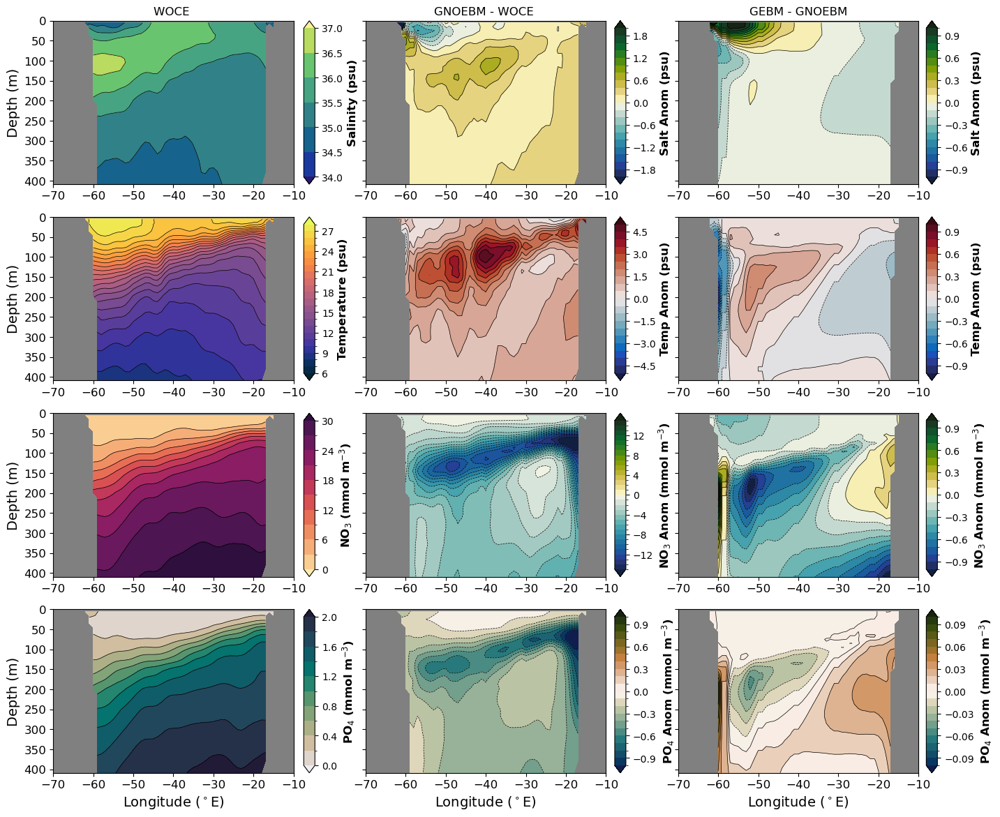

In [58]:
fig = plt.figure(figsize=(16,14))

def setscale(axx):
    #linear_piecewise_scale(dc*10, ds, ax = axx)
    # Rearange the yticks
    #axx.set_yticks([0.0, 5000, 10000., 15000., 20000.]);
    #axx.set_yticklabels(["0", "50", "100", "150", "200"]);
    axx.set_yticks([0.0, 5000, 10000., 15000., 20000., 25000., 30000., 35000., 40000.]);
    axx.set_yticklabels(["0", "50", "100", "150", "200", "250", "300", "350", "400"]);
    #axx.axhline(50000, color='0.5', ls='--')

def setaxesfsize(axl,fontsize, xlabel, ylabel, labsize):
    ticklabelbot = axl.get_xticklabels()
    ticklabelleft = axl.get_yticklabels()
    for labelx in ticklabelbot:
        labelx.set_fontsize(fontsize)
#    i=0
    for labely in ticklabelleft:
#        if i != 0:
            labely.set_fontsize(fontsize)
    
    axl.set_xlabel(xlabel, size=labsize)
    axl.set_ylabel(ylabel, size=labsize)
    
def hide_yticks(axx):
    axx.yaxis.set_tick_params(labelleft=False)
    #axx.set_yticks([])


clev = np.linspace(-40,40,41)
alev = np.linspace(-4,4,41)

ax1 = plt.subplot(431)
ax2 = plt.subplot(432)
ax3 = plt.subplot(433)

ax4 = plt.subplot(434)
ax5 = plt.subplot(435)
ax6 = plt.subplot(436)

ax7 = plt.subplot(437)
ax8 = plt.subplot(438)
ax9 = plt.subplot(439)

ax10 = plt.subplot(4,3,10)
ax11 = plt.subplot(4,3,11)
ax12 = plt.subplot(4,3,12)

ax = [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8 ,ax9, ax10, ax11, ax12]

titlesize=14
axeslbfs=14
axesfs=12
cbarsx = 0.0015 # shift colorbars right a bit
cbarsx_r = 0.007 # shift colorbars right a bit
cbar0 = 0.005
mapextent = [290, 360, -25, 25]

levstr = ""


lat=10.0
lon1=-70
lon2=-10
d1=0.
d2=42000.

# Salt
woce_salt = woce_rg_glo.SALINITY.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_salt = gebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt
bebm_woce_salt = bebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt
gnoebm_woce_salt = gnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt
bnoebm_woce_salt = bnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt
gnoebm_salt = gnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bnoebm_salt = bnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_salt = gebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bebm_salt = bebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_gnoebm_salt = gebm_salt - gnoebm_salt
bebm_gnoebm_salt = bebm_salt - bnoebm_salt

colmap = ocm.cm.haline
clevs = np.linspace(34,37,7)

p1 = woce_salt.plot.contourf(ax = ax1, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p1_0 = woce_salt.plot.contour(ax = ax1, levels = clevs, colors='k', linewidths=0.5)
ax1.set_title("WOCE " + levstr)
cbstr="Salinity (psu)"
call_vert_cbar(fig, ax1, cbarsx-cbar0, 0.0, p1, cbstr, width=0.01)

# Differences salt
dcolmap = ocm.cm.delta
dlevs = np.linspace(-2,2,21)

p2 = gnoebm_woce_salt.plot.contourf(ax = ax2, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p2_0 = gnoebm_woce_salt.plot.contour(ax = ax2, levels = dlevs, colors='k', linewidths=0.5)
ax2.set_title("GNOEBM - WOCE " + levstr)
cbstr="Salt Anom (psu)"
call_vert_cbar(fig, ax2, cbarsx, 0.0, p2, cbstr, width=0.01)

# Differences ebm-noebm
dcolmap = ocm.cm.delta
dlevs = np.linspace(-1,1,21)

p3 = gebm_gnoebm_salt.plot.contourf(ax = ax3, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p3_0 = gebm_gnoebm_salt.plot.contour(ax = ax3, levels = dlevs, colors='k', linewidths=0.5)
ax3.set_title("GEBM - GNOEBM " + levstr)
cbstr="Salt Anom (psu)"
call_vert_cbar(fig, ax3, cbarsx_r, 0.0, p3, cbstr, width=0.01)

# temp

woce_temp = woce_rg_glo.TPOTEN.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_temp = gebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_temp
bebm_woce_temp = bebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_temp
gnoebm_woce_temp = gnoebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_temp
bnoebm_woce_temp = bnoebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_temp
gnoebm_temp = gnoebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bnoebm_temp = bnoebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_temp = gebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bebm_temp = bebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_gnoebm_temp = gebm_temp - gnoebm_temp
bebm_gnoebm_temp = bebm_temp - bnoebm_temp

colmap = ocm.cm.thermal
clevs = np.linspace(6,28,23)

p4 = woce_temp.plot.contourf(ax = ax4, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p4_0 = woce_temp.plot.contour(ax = ax4, levels = clevs, colors='k', linewidths=0.5)
ax4.set_title("WOCE " + levstr)
cbstr="Temperature (psu)"
call_vert_cbar(fig, ax4, cbarsx-cbar0, 0.0, p4, cbstr, width=0.01)

# Differences temp
dcolmap = ocm.cm.balance
dlevs = np.linspace(-5,5,21)

p5 = gnoebm_woce_temp.plot.contourf(ax = ax5, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p5_0 = gnoebm_woce_temp.plot.contour(ax = ax5, levels = dlevs, colors='k', linewidths=0.5)
ax5.set_title("GNOEBM - WOCE " + levstr)
cbstr="Temp Anom (psu)"
call_vert_cbar(fig, ax5, cbarsx, 0.0, p5, cbstr, width=0.01)

# Differences ebm - noebm
dcolmap = ocm.cm.balance
dlevs = np.linspace(-1,1,21)

p6 = gebm_gnoebm_temp.plot.contourf(ax = ax6, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p6_0 = gebm_gnoebm_temp.plot.contour(ax = ax6, levels = dlevs, colors='k', linewidths=0.5)
ax6.set_title("GEBM - GNOEBM " + levstr)
cbstr="Temp Anom (psu)"
call_vert_cbar(fig, ax6, cbarsx_r, 0.0, p6, cbstr, width=0.01)

# Nitrate
woce_no3 = woce_rg_glo.NITRATE.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_no3 = gebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_no3
bebm_woce_no3 = bebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_no3
gnoebm_woce_no3 = gnoebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_no3
bnoebm_woce_no3 = bnoebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_no3
gnoebm_no3 = gnoebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bnoebm_no3 = bnoebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_no3 = gebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bebm_no3 = bebm_NO3.NO3.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_gnoebm_no3 = gebm_no3 - gnoebm_no3
bebm_gnoebm_no3 = bebm_no3 - bnoebm_no3

colmap = ocm.cm.matter
clevs = np.linspace(0,30,11)

p7 = woce_no3.plot.contourf(ax = ax7, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p7_0 = woce_no3.plot.contour(ax = ax7, levels = clevs, colors='k', linewidths=0.5)
ax7.set_title("WOCE " + levstr)
cbstr="NO$_3$ (mmol m$^{-3}$)"
call_vert_cbar(fig, ax7, cbarsx-cbar0, 0.0, p7, cbstr, width=0.01)

# Differences Nitrate
dcolmap = ocm.cm.delta
dlevs = np.linspace(-15,15,31)

p8 = gnoebm_woce_no3.plot.contourf(ax = ax8, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p8_0 = gnoebm_woce_no3.plot.contour(ax = ax8, levels = dlevs, colors='k', linewidths=0.5)
ax8.set_title("GNOEBM - WOCE " + levstr)
cbstr="NO$_3$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax8, cbarsx, 0.0, p8, cbstr, width=0.01)

# Differences ebm - noebm
dcolmap = ocm.cm.delta
dlevs = np.linspace(-1,1,21)

p9 = gebm_gnoebm_no3.plot.contourf(ax = ax9, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p9_0 = gebm_gnoebm_no3.plot.contour(ax = ax9, levels = dlevs, colors='k', linewidths=0.5)
ax9.set_title("GNOEBM - WOCE " + levstr)
cbstr="NO$_3$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax9, cbarsx_r, 0.0, p9, cbstr, width=0.01)

# phosphate
woce_po4 = woce_rg_glo.PHOSPH.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_po4 = gebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_po4
bebm_woce_po4 = bebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_po4
gnoebm_woce_po4 = gnoebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_po4
bnoebm_woce_po4 = bnoebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_po4
gnoebm_po4 = gnoebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bnoebm_po4 = bnoebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_po4 = gebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bebm_po4 = bebm_PO4.PO4.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_gnoebm_po4 = gebm_po4 - gnoebm_po4
bebm_gnoebm_po4 = bebm_po4 - bnoebm_po4

colmap=ocm.cm.rain
clevs=np.linspace(0,2, 11)

p10 = woce_po4.plot.contourf(ax = ax10, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p10_0 = woce_po4.plot.contour(ax = ax10, levels = clevs, colors='k', linewidths=0.5)
ax10.set_title("WOCE " + levstr)
cbstr="PO$_4$ (mmol m$^{-3}$)"
call_vert_cbar(fig, ax10, cbarsx-cbar0, 0.0, p10, cbstr, width=0.01)

# Differences phosphate
dcolmap=ocm.cm.reg_map_r
dlevs=np.linspace(-1,1,21)

p11 = gnoebm_woce_po4.plot.contourf(ax = ax11, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p11_0 = gnoebm_woce_po4.plot.contour(ax = ax11, levels = dlevs, colors='k', linewidths=0.5)
ax11.set_title("GNOEBM - WOCE " + levstr)
cbstr="PO$_4$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax11, cbarsx, 0.0, p11, cbstr, width=0.01)

# Differences phosphate
dcolmap=ocm.cm.reg_map_r
dlevs=np.linspace(-0.1,0.1,21)

p12 = gebm_gnoebm_po4.plot.contourf(ax = ax12, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p12_0 = gebm_gnoebm_po4.plot.contour(ax = ax12, levels = dlevs, colors='k', linewidths=0.5)
ax12.set_title("GEBM - GNOEBM " + levstr)
cbstr="PO$_4$ Anom (mmol m$^{-3}$)"
call_vert_cbar(fig, ax12, cbarsx_r, 0.0, p12, cbstr, width=0.01)

for i in range(0,12):
    ax[i].set_facecolor('grey')
    ax[i].invert_yaxis()
    setscale(ax[i])
    setaxesfsize(ax[i],12, "", "", 14)
    #ax[i].grid()
    ax[i].set_title("")

#ax.set(xlabel='Longitude ($^\circ$E)', ylabel='Depth (cm)')
#setaxesfsize(ax[i],12, "Longitude ($^\circ$E)", "Depth (m)", 14)
setaxesfsize(ax[0],12, "", "Depth (m)", 14)
setaxesfsize(ax[3],12, "", "Depth (m)", 14)
setaxesfsize(ax[6],12, "", "Depth (m)", 14)
setaxesfsize(ax[9],12, "Longitude ($^\circ$E)", "Depth (m)", 14)
setaxesfsize(ax[10],12, "Longitude ($^\circ$E)", "", 14)
setaxesfsize(ax[11],12, "Longitude ($^\circ$E)", "", 14)
# hide yticks on some plots
hide_yticks(ax[1])
hide_yticks(ax[2])
hide_yticks(ax[4])
hide_yticks(ax[5])
hide_yticks(ax[7])
hide_yticks(ax[8])
hide_yticks(ax[10])
hide_yticks(ax[11])

ax1.set_title("WOCE " + levstr)
ax2.set_title("GNOEBM - WOCE " + levstr)
ax3.set_title("GEBM - GNOEBM" + levstr)


plt.subplots_adjust(wspace=0.3)

icepaperdir="/home/guido/Dropbox/plots/estuaries/"
saveplot=False

if saveplot:
    plt.savefig(icepaperdir+"Figure_Amazon_10N_cross_section_v2.png", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)
    plt.savefig(icepaperdir+"Figure_Amazon_10N_cross_section_v2.pdf", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)



209.71138671875


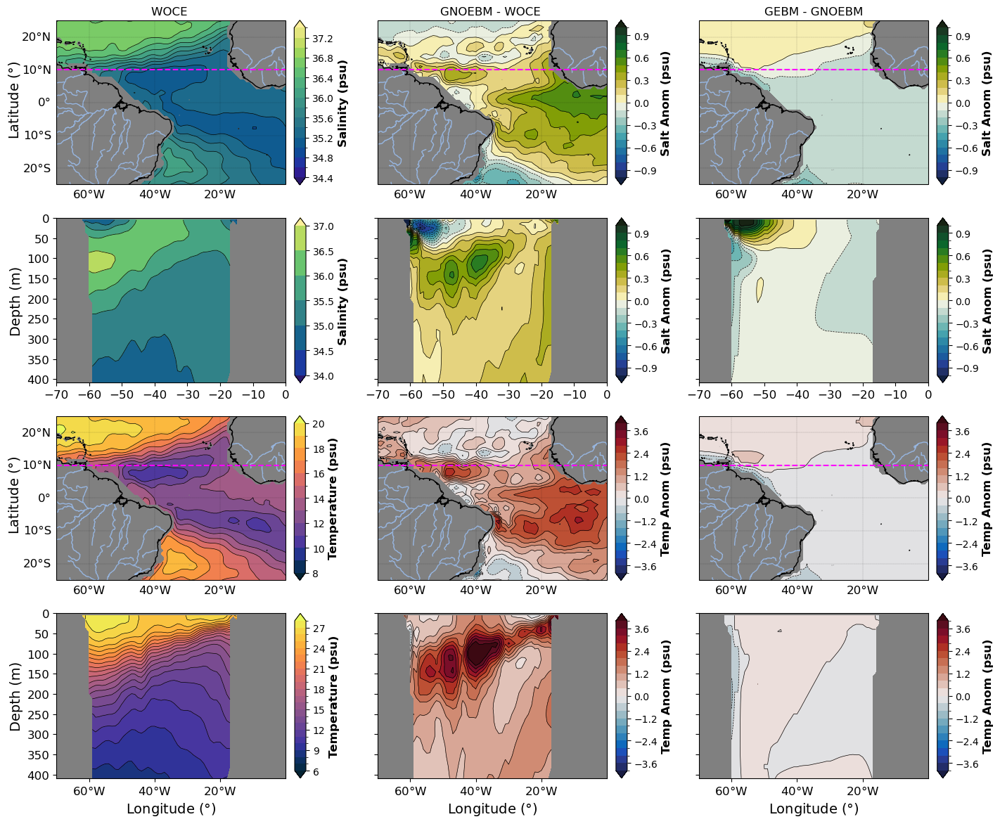

In [59]:
fig = plt.figure(figsize=(16,14))

colmap = ocm.cm.haline
acolmap = plt.cm.bwr

clev = np.linspace(-40,40,41)
alev = np.linspace(-4,4,41)

ax1 = plt.subplot(431,projection=ccrs.PlateCarree())
ax2 = plt.subplot(432,projection=ccrs.PlateCarree())
ax3 = plt.subplot(433,projection=ccrs.PlateCarree())

ax4 = plt.subplot(437,projection=ccrs.PlateCarree())
ax5 = plt.subplot(438,projection=ccrs.PlateCarree())
ax6 = plt.subplot(439,projection=ccrs.PlateCarree())

ax7 = plt.subplot(434)
ax8 = plt.subplot(435)
ax9 = plt.subplot(436)

ax10 = plt.subplot(4,3,10)
ax11 = plt.subplot(4,3,11)
ax12 = plt.subplot(4,3,12)

ax = [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8 ,ax9, ax10, ax11, ax12]

titlesize=14
axeslbfs=14
axesfs=12
cbarsx = 0.01 # shift colorbars right a bit
grid_ls = 12 # grid label size
mapextent = [290, 360, -25, 25]
zlev = 20
print(woce_rg_glo.z_t[zlev].values/100.)
levstr = "(200 m depth)"

# obs salt
colmap = ocm.cm.haline
clevs = np.linspace(34.4,37.4,16)

ax1.set_extent(mapextent, ccrs.PlateCarree())
p1 = woce_rg_glo.SALINITY[zlev,:,:].plot.contourf(ax = ax1, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p1_0 = woce_rg_glo.SALINITY[zlev,:,:].plot.contour(ax = ax1, levels = clevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax1, grid_ls, xon=True, yon=True)
ax1.set_title("WOCE " + levstr)
cbstr="Salinity (psu)"
cbarsx = -0.005
call_vert_cbar(fig, ax1, cbarsx, 0.0, p1, cbstr, width=0.01)

# Differences salt
dcolmap = ocm.cm.delta
dlevs = np.linspace(-1,1,21)

ax2.set_extent(mapextent, ccrs.PlateCarree())
p2 = (gnoebm_SALT.SALT[zlev,:,:] - woce_rg_glo.SALINITY[zlev,:,:]).plot.contourf(ax = ax2, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p2_0 = (gnoebm_SALT.SALT[zlev,:,:] - woce_rg_glo.SALINITY[zlev,:,:]).plot.contour(ax = ax2, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax2, grid_ls, xon=True, yon=False)
ax2.set_title("GNOEBM - WOCE " + levstr)
cbstr="Salt Anom (psu)"
cbarsx = 0.007
call_vert_cbar(fig, ax2, cbarsx, 0.0, p2, cbstr, width=0.01)

# Differences ebm-noebm
dcolmap = ocm.cm.delta
dlevs = np.linspace(-1,1,21)

ax3.set_extent(mapextent, ccrs.PlateCarree())
p3 = gdiff_SALT.SALT[zlev,:,:].plot.contourf(ax = ax3, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p3_0 = gdiff_SALT.SALT[zlev,:,:].plot.contour(ax = ax3, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax3, grid_ls, xon=True, yon=False)
ax3.set_title("GEBM - GNOEBM " + levstr)
cbarsx = 0.019
call_vert_cbar(fig, ax3, cbarsx, 0.0, p3, cbstr, width=0.01)

# obs temp
colmap = ocm.cm.thermal
clevs = np.linspace(8,20,13)

ax4.set_extent(mapextent, ccrs.PlateCarree())
p4 = woce_rg_glo.TPOTEN[zlev,:,:].plot.contourf(ax = ax4, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p4_0 = woce_rg_glo.TPOTEN[zlev,:,:].plot.contour(ax = ax4, levels = clevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax4, grid_ls, xon=True, yon=True)
#ax4.set_title("WOCE " + levstr)
ax4.set_title("")
cbstr="Temperature (psu)"
cbarsx = -0.005
call_vert_cbar(fig, ax4, cbarsx, 0.0, p4, cbstr, width=0.01)

# Differences temp
dcolmap = ocm.cm.balance
dlevs = np.linspace(-4,4,21)

ax5.set_extent(mapextent, ccrs.PlateCarree())
p5 = (gnoebm_TEMP.TEMP[zlev,:,:] - woce_rg_glo.TPOTEN[zlev,:,:]).plot.contourf(ax = ax5, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p5_0 = (gnoebm_TEMP.TEMP[zlev,:,:] - woce_rg_glo.TPOTEN[zlev,:,:]).plot.contour(ax = ax5, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax5, grid_ls, xon=True, yon=False)
#ax5.set_title("GNOEBM - WOCE " + levstr)
ax5.set_title("")
cbstr="Temp Anom (psu)"
cbarsx = 0.007
call_vert_cbar(fig, ax5, cbarsx, 0.0, p5, cbstr, width=0.01)

# Differences ebm - noebm
dcolmap = ocm.cm.balance
dlevs = np.linspace(-4,4,21)

ax6.set_extent(mapextent, ccrs.PlateCarree())
p6 = gdiff_TEMP.TEMP[zlev,:,:].plot.contourf(ax = ax6, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p6_0 = gdiff_TEMP.TEMP[zlev,:,:].plot.contour(ax = ax6, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax6, grid_ls, xon=True, yon=False)
#ax6.set_title("GEBM - GNOEBM " + levstr)
ax6.set_title("")
cbarsx = 0.019
call_vert_cbar(fig, ax6, cbarsx, 0.0, p6, cbstr, width=0.01)



titlesize=14
axeslbfs=14
axesfs=12
cbarsx = 0.0015 # shift colorbars right a bit
cbarsx_r = 0.007 # shift colorbars right a bit
cbar0 = 0.005

levstr = ""


lat=10.0
lon1=-70
lon2=0
d1=0.
d2=42000.

# Salt
woce_salt = woce_rg_glo.SALINITY.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_salt = gebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt
bebm_woce_salt = bebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt
gnoebm_woce_salt = gnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt
bnoebm_woce_salt = bnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt
gnoebm_salt = gnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bnoebm_salt = bnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_salt = gebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bebm_salt = bebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_gnoebm_salt = gebm_salt - gnoebm_salt
bebm_gnoebm_salt = bebm_salt - bnoebm_salt

colmap = ocm.cm.haline
clevs = np.linspace(34,37,7)

p7 = woce_salt.plot.contourf(ax = ax7, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p7_0 = woce_salt.plot.contour(ax = ax7, levels = clevs, colors='k', linewidths=0.5)
#ax7.set_title("WOCE " + levstr)
cbstr="Salinity (psu)"
cbarsx = -0.016
call_vert_cbar(fig, ax7, cbarsx, 0.0, p7, cbstr, width=0.01)

# Differences salt
dcolmap = ocm.cm.delta
dlevs = np.linspace(-1,1,21)

p8 = gnoebm_woce_salt.plot.contourf(ax = ax8, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p8_0 = gnoebm_woce_salt.plot.contour(ax = ax8, levels = dlevs, colors='k', linewidths=0.5)
#ax8.set_title("GNOEBM - WOCE " + levstr)
cbstr="Salt Anom (psu)"
cbarsx = -0.004
call_vert_cbar(fig, ax8, cbarsx, 0.0, p8, cbstr, width=0.01)

# Differences ebm-noebm
dcolmap = ocm.cm.delta
dlevs = np.linspace(-1,1,21)

p9 = gebm_gnoebm_salt.plot.contourf(ax = ax9, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p9_0 = gebm_gnoebm_salt.plot.contour(ax = ax9, levels = dlevs, colors='k', linewidths=0.5)
#ax9.set_title("GEBM - GNOEBM " + levstr)
cbstr="Salt Anom (psu)"
cbarsx = 0.008
call_vert_cbar(fig, ax9, cbarsx, 0.0, p9, cbstr, width=0.01)

# vertical profiles
# temp

woce_temp = woce_rg_glo.TPOTEN.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_temp = gebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_temp
bebm_woce_temp = bebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_temp
gnoebm_woce_temp = gnoebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_temp
bnoebm_woce_temp = bnoebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_temp
gnoebm_temp = gnoebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bnoebm_temp = bnoebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_temp = gebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bebm_temp = bebm_TEMP.TEMP.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_gnoebm_temp = gebm_temp - gnoebm_temp
bebm_gnoebm_temp = bebm_temp - bnoebm_temp

colmap = ocm.cm.thermal
clevs = np.linspace(6,28,23)

p10 = woce_temp.plot.contourf(ax = ax10, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p10_0 = woce_temp.plot.contour(ax = ax10, levels = clevs, colors='k', linewidths=0.5)
#ax10.set_title("WOCE " + levstr)
cbstr="Temperature (psu)"
cbarsx = -0.016
call_vert_cbar(fig, ax10, cbarsx, 0.0, p10, cbstr, width=0.01)

# Differences temp
dcolmap = ocm.cm.balance
dlevs = np.linspace(-4,4,21)

p11 = gnoebm_woce_temp.plot.contourf(ax = ax11, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p11_0 = gnoebm_woce_temp.plot.contour(ax = ax11, levels = dlevs, colors='k', linewidths=0.5)
#ax11.set_title("GNOEBM - WOCE " + levstr)
cbstr="Temp Anom (psu)"
cbarsx = -0.004
call_vert_cbar(fig, ax11, cbarsx, 0.0, p11, cbstr, width=0.01)

# Differences ebm - noebm
dcolmap = ocm.cm.balance
dlevs = np.linspace(-4,4,21)

p12 = gebm_gnoebm_temp.plot.contourf(ax = ax12, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p12_0 = gebm_gnoebm_temp.plot.contour(ax = ax12, levels = dlevs, colors='k', linewidths=0.5)
#ax12.set_title("GEBM - GNOEBM " + levstr)
cbstr="Temp Anom (psu)"
cbarsx = 0.008
call_vert_cbar(fig, ax12, cbarsx, 0.0, p12, cbstr, width=0.01)

for i in range(6,12):
    ax[i].set_facecolor('grey')
    ax[i].invert_yaxis()
    setscale(ax[i])
    setaxesfsize(ax[i],12, "", "", 14)
    #ax[i].grid()
    ax[i].set_title("")

#ax.set(xlabel='Longitude ($^\circ$E)', ylabel='Depth (cm)')
#setaxesfsize(ax[i],12, "Longitude ($^\circ$E)", "Depth (m)", 14)
setaxesfsize(ax[0],12, "", "Latitude", 14)
#setaxesfsize(ax[3],12, "", "Depth (m)", 14)
setaxesfsize(ax[3],12, "", "Latitude", 14)
#setaxesfsize(ax[4],12, "Longitude ($^\circ$E)", "", 14)
#setaxesfsize(ax[5],12, "Longitude ($^\circ$E)", "", 14)
setaxesfsize(ax[6],12, "", "Depth (m)", 14)
setaxesfsize(ax[9],12, "Longitude ($\degree$)", "Depth (m)", 14)
setaxesfsize(ax[10],12, "Longitude ($\degree$)", "", 14)
setaxesfsize(ax[11],12, "Longitude ($\degree$)", "", 14)
# hide yticks on some plots
#hide_yticks(ax[1])
#hide_yticks(ax[2])
#hide_yticks(ax[4])
#hide_yticks(ax[5])
hide_yticks(ax[7])
hide_yticks(ax[8])
hide_yticks(ax[10])
hide_yticks(ax[11])

ax1.set_title("WOCE " + levstr)
ax2.set_title("GNOEBM - WOCE " + levstr)
ax3.set_title("GEBM - GNOEBM" + levstr)

for i in range(3,12):
    ax[i].set_title("")

ax[0].text(-85,-10,"Latitude ($\degree$)",fontsize=14,rotation=90.)
ax[3].text(-85,-10,"Latitude ($\degree$)",fontsize=14,rotation=90.)

ax[9].set_xticks([-60,-40,-20])
ax[9].set_xticklabels(["60$\degree$W", "40$\degree$W", "20$\degree$W"])
ax[10].set_xticks([-60,-40,-20])
ax[10].set_xticklabels(["60$\degree$W", "40$\degree$W", "20$\degree$W"])
ax[11].set_xticks([-60,-40,-20])
ax[11].set_xticklabels(["60$\degree$W", "40$\degree$W", "20$\degree$W"])

proj = ccrs.PlateCarree()
linecol='magenta'
ax[0].plot([-70, 0], [10, 10], transform=proj, color=linecol, linestyle='--')
ax[1].plot([-70, 0], [10, 10], transform=proj, color=linecol, linestyle='--')
ax[2].plot([-70, 0], [10, 10], transform=proj, color=linecol, linestyle='--')

ax[3].plot([-70, 0], [10, 10], transform=proj, color=linecol, linestyle='--')
ax[4].plot([-70, 0], [10, 10], transform=proj, color=linecol, linestyle='--')
ax[5].plot([-70, 0], [10, 10], transform=proj, color=linecol, linestyle='--')

ax[3].axhline(y = 200, xmin = 0, xmax = 1, color = 'red')
#ax = [ ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12]
#for i in range(12):
#    set_amazon_xygrid(ax[i], grid_ls, xon=True, yon=True)
    

#plt.subplots_adjust(hspace=0.35, wspace=.25)
# figure labels (make it look like Nature)
#lbfs=14
#xl = -0.
#yl = 1.1
#ax1.text(xl, yl, "a)", ha='left', va='top', size=lbfs, weight='bold', transform=ax1.transAxes)
#ax2.text(xl, yl, "b)", ha='left', va='top', size=lbfs, weight='bold', transform=ax2.transAxes)
#ax3.text(xl, yl, "c)", ha='left', va='top', size=lbfs, weight='bold', transform=ax3.transAxes)
#ax4.text(xl, yl, "d)", ha='left', va='top', size=lbfs, weight='bold', transform=ax4.transAxes)
#ax5.text(xl, yl, "e)", ha='left', va='top', size=lbfs, weight='bold', transform=ax5.transAxes)
#ax6.text(xl, yl, "f)", ha='left', va='top', size=lbfs, weight='bold', transform=ax6.transAxes)
#ax7.text(xl, yl, "g)", ha='left', va='top', size=lbfs, weight='bold', transform=ax7.transAxes)
#ax8.text(xl, yl, "h)", ha='left', va='top', size=lbfs, weight='bold', transform=ax8.transAxes)
#ax9.text(xl, yl, "i)", ha='left', va='top', size=lbfs, weight='bold', transform=ax9.transAxes)
#ax10.text(xl, yl, "j)", ha='left', va='top', size=lbfs, weight='bold', transform=ax10.transAxes)
#ax11.text(xl, yl, "k)", ha='left', va='top', size=lbfs, weight='bold', transform=ax11.transAxes)
#ax12.text(xl, yl, "l)", ha='left', va='top', size=lbfs, weight='bold', transform=ax12.transAxes)

#plt.tight_layout()
plt.subplots_adjust(wspace=0.4)
icepaperdir="/home/guido/Dropbox/plots/estuaries/"
saveplot=False

if saveplot:
    plt.savefig(icepaperdir+"Figure_Amazon_200m_SALT_TEMP.png", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)
    plt.savefig(icepaperdir+"Figure_Amazon_200m_SALT_TEMP.pdf", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)



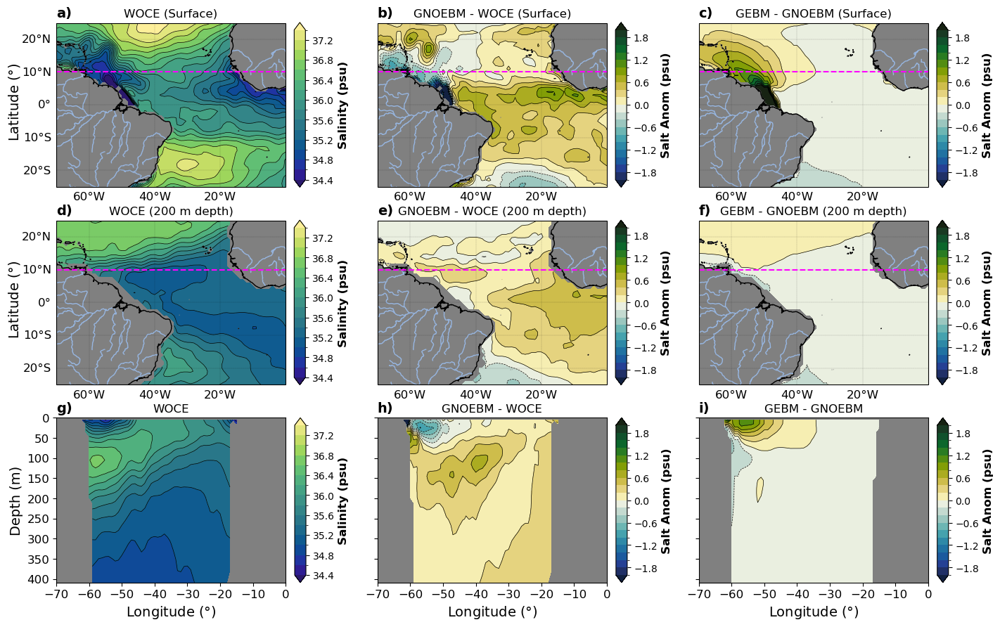

In [62]:
fig = plt.figure(figsize=(16,14))

colmap = ocm.cm.haline
acolmap = plt.cm.bwr

clev = np.linspace(-40,40,41)
alev = np.linspace(-4,4,41)

ax1 = plt.subplot(431,projection=ccrs.PlateCarree())
ax2 = plt.subplot(432,projection=ccrs.PlateCarree())
ax3 = plt.subplot(433,projection=ccrs.PlateCarree())

ax4 = plt.subplot(434,projection=ccrs.PlateCarree())
ax5 = plt.subplot(435,projection=ccrs.PlateCarree())
ax6 = plt.subplot(436,projection=ccrs.PlateCarree())

ax7 = plt.subplot(437)
ax8 = plt.subplot(438)
ax9 = plt.subplot(439)

ax = [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8 ,ax9, ax10, ax11, ax12]

titlesize=14
axeslbfs=14
axesfs=12
cbarsx = 0.01 # shift colorbars right a bit
grid_ls = 12 # grid label size
mapextent = [290, 360, -25, 25]
zlev = 0

#print(woce_rg_glo.z_t[zlev].values/100.)
levstr = "(Surface)"

# obs salt
colmap = ocm.cm.haline
clevs = np.linspace(34.4,37.4,16)

ax1.set_extent(mapextent, ccrs.PlateCarree())
p1 = woce_rg_glo.SALINITY[zlev,:,:].plot.contourf(ax = ax1, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p1_0 = woce_rg_glo.SALINITY[zlev,:,:].plot.contour(ax = ax1, levels = clevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax1, grid_ls, xon=True, yon=True)
ax1.set_title("WOCE " + levstr)
cbstr="Salinity (psu)"
cbarsx = -0.005
call_vert_cbar(fig, ax1, cbarsx, 0.0, p1, cbstr, width=0.01)

# Differences salt
dcolmap = ocm.cm.delta
dlevs = np.linspace(-2,2,21)

ax2.set_extent(mapextent, ccrs.PlateCarree())
p2 = (gnoebm_SALT.SALT[zlev,:,:] - woce_rg_glo.SALINITY[zlev,:,:]).plot.contourf(ax = ax2, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p2_0 = (gnoebm_SALT.SALT[zlev,:,:] - woce_rg_glo.SALINITY[zlev,:,:]).plot.contour(ax = ax2, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax2, grid_ls, xon=True, yon=False)
ax2.set_title("GNOEBM - WOCE " + levstr)
cbstr="Salt Anom (psu)"
cbarsx = 0.007
call_vert_cbar(fig, ax2, cbarsx, 0.0, p2, cbstr, width=0.01)

# Differences ebm-noebm
#dcolmap = ocm.cm.delta
#dlevs = np.linspace(-1,1,21)

ax3.set_extent(mapextent, ccrs.PlateCarree())
p3 = gdiff_SALT.SALT[zlev,:,:].plot.contourf(ax = ax3, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p3_0 = gdiff_SALT.SALT[zlev,:,:].plot.contour(ax = ax3, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax3, grid_ls, xon=True, yon=False)
ax3.set_title("GEBM - GNOEBM " + levstr)
cbarsx = 0.019
call_vert_cbar(fig, ax3, cbarsx, 0.0, p3, cbstr, width=0.01)

# obs salt 
zlev = 20
levstr = "(200 m depth)"

ax4.set_extent(mapextent, ccrs.PlateCarree())
p4 = woce_rg_glo.SALINITY[zlev,:,:].plot.contourf(ax = ax4, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p4_0 = woce_rg_glo.SALINITY[zlev,:,:].plot.contour(ax = ax4, levels = clevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax4, grid_ls, xon=True, yon=True)
ax4.set_title("WOCE " + levstr)
#ax4.set_title("")
cbstr="Salinity (psu)"
cbarsx = -0.005
call_vert_cbar(fig, ax4, cbarsx, 0.0, p4, cbstr, width=0.01)


ax5.set_extent(mapextent, ccrs.PlateCarree())
p5 = (gnoebm_SALT.SALT[zlev,:,:] - woce_rg_glo.SALINITY[zlev,:,:]).plot.contourf(ax = ax5, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p5_0 = (gnoebm_SALT.SALT[zlev,:,:] - woce_rg_glo.SALINITY[zlev,:,:]).plot.contour(ax = ax5, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax5, grid_ls, xon=True, yon=False)
ax5.set_title("GNOEBM - WOCE " + levstr)
#ax5.set_title("")
cbstr="Salt Anom (psu)"
cbarsx = 0.007
call_vert_cbar(fig, ax5, cbarsx, 0.0, p5, cbstr, width=0.01)

ax6.set_extent(mapextent, ccrs.PlateCarree())
p6 = gdiff_SALT.SALT[zlev,:,:].plot.contourf(ax = ax6, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p6_0 = gdiff_SALT.SALT[zlev,:,:].plot.contour(ax = ax6, levels = dlevs, colors='k', linewidths=0.5)
set_amazon_xygrid(ax6, grid_ls, xon=True, yon=False)
ax6.set_title("GEBM - GNOEBM " + levstr)
#ax6.set_title("")
cbarsx = 0.019
call_vert_cbar(fig, ax6, cbarsx, 0.0, p6, cbstr, width=0.01)



titlesize=14
axeslbfs=14
axesfs=12
cbarsx = 0.0015 # shift colorbars right a bit
cbarsx_r = 0.007 # shift colorbars right a bit
cbar0 = 0.005

#levstr = ""


lat=10.0
lon1=-70
lon2=0
d1=0.
d2=42000.

# Salt
woce_salt = woce_rg_glo.SALINITY.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_woce_salt = gebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt
bebm_woce_salt = bebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt
gnoebm_woce_salt = gnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt
bnoebm_woce_salt = bnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2)) - woce_salt
gnoebm_salt = gnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bnoebm_salt = bnoebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_salt = gebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
bebm_salt = bebm_SALT.SALT.sel(lat=lat, method='nearest').sel(lon=slice(lon1,lon2)).sel(z_t=slice(d1,d2))
gebm_gnoebm_salt = gebm_salt - gnoebm_salt
bebm_gnoebm_salt = bebm_salt - bnoebm_salt

#colmap = ocm.cm.haline
#clevs = np.linspace(34,37,7)

p7 = woce_salt.plot.contourf(ax = ax7, levels = clevs, cmap = colmap, add_colorbar=False, extend='both')
p7_0 = woce_salt.plot.contour(ax = ax7, levels = clevs, colors='k', linewidths=0.5)
ax7.set_title("WOCE")
cbstr="Salinity (psu)"
cbarsx = -0.016
call_vert_cbar(fig, ax7, cbarsx, 0.0, p7, cbstr, width=0.01)

# Differences salt
#dcolmap = ocm.cm.delta
#dlevs = np.linspace(-1,1,21)

p8 = gnoebm_woce_salt.plot.contourf(ax = ax8, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p8_0 = gnoebm_woce_salt.plot.contour(ax = ax8, levels = dlevs, colors='k', linewidths=0.5)
ax8.set_title("GNOEBM - WOCE")
cbstr="Salt Anom (psu)"
cbarsx = -0.004
call_vert_cbar(fig, ax8, cbarsx, 0.0, p8, cbstr, width=0.01)

# Differences ebm-noebm
#dcolmap = ocm.cm.delta
#dlevs = np.linspace(-1,1,21)

p9 = gebm_gnoebm_salt.plot.contourf(ax = ax9, levels = dlevs, cmap = dcolmap, add_colorbar=False, extend='both')
p9_0 = gebm_gnoebm_salt.plot.contour(ax = ax9, levels = dlevs, colors='k', linewidths=0.5)
ax9.set_title("GEBM - GNOEBM")
cbstr="Salt Anom (psu)"
cbarsx = 0.008
call_vert_cbar(fig, ax9, cbarsx, 0.0, p9, cbstr, width=0.01)


for i in range(6,12):
    ax[i].set_facecolor('grey')
    ax[i].invert_yaxis()
    setscale(ax[i])
    setaxesfsize(ax[i],12, "", "", 14)
    #ax[i].grid()
    #ax[i].set_title("")

#ax.set(xlabel='Longitude ($^\circ$E)', ylabel='Depth (cm)')
#setaxesfsize(ax[i],12, "Longitude ($^\circ$E)", "Depth (m)", 14)
setaxesfsize(ax[0],12, "", "Latitude", 14)
#setaxesfsize(ax[3],12, "", "Depth (m)", 14)
setaxesfsize(ax[3],12, "", "Latitude", 14)
#setaxesfsize(ax[4],12, "Longitude ($^\circ$E)", "", 14)
#setaxesfsize(ax[5],12, "Longitude ($^\circ$E)", "", 14)
#setaxesfsize(ax[6],12, "", "Depth (m)", 14)
setaxesfsize(ax[6],12, "Longitude ($\degree$)", "Depth (m)", 14)
setaxesfsize(ax[7],12, "Longitude ($\degree$)", "", 14)
setaxesfsize(ax[8],12, "Longitude ($\degree$)", "", 14)
# hide yticks on some plots
#hide_yticks(ax[1])
#hide_yticks(ax[2])
#hide_yticks(ax[4])
#hide_yticks(ax[5])
hide_yticks(ax[7])
hide_yticks(ax[8])
hide_yticks(ax[10])
hide_yticks(ax[11])

#ax1.set_title("WOCE " + levstr)
#ax2.set_title("GNOEBM - WOCE " + levstr)
#ax3.set_title("GEBM - GNOEBM" + levstr)

#for i in range(3,12):
#    ax[i].set_title("")

ax[0].text(-85,-10,"Latitude ($\degree$)",fontsize=14,rotation=90.)
ax[3].text(-85,-10,"Latitude ($\degree$)",fontsize=14,rotation=90.)

ax[9].set_xticks([-60,-40,-20])
ax[9].set_xticklabels(["60$\degree$W", "40$\degree$W", "20$\degree$W"])
ax[10].set_xticks([-60,-40,-20])
ax[10].set_xticklabels(["60$\degree$W", "40$\degree$W", "20$\degree$W"])
ax[11].set_xticks([-60,-40,-20])
ax[11].set_xticklabels(["60$\degree$W", "40$\degree$W", "20$\degree$W"])

proj = ccrs.PlateCarree()
linecol='magenta'
ax[0].plot([-70, 0], [10, 10], transform=proj, color=linecol, linestyle='--')
ax[1].plot([-70, 0], [10, 10], transform=proj, color=linecol, linestyle='--')
ax[2].plot([-70, 0], [10, 10], transform=proj, color=linecol, linestyle='--')

ax[3].plot([-70, 0], [10, 10], transform=proj, color=linecol, linestyle='--')
ax[4].plot([-70, 0], [10, 10], transform=proj, color=linecol, linestyle='--')
ax[5].plot([-70, 0], [10, 10], transform=proj, color=linecol, linestyle='--')

ax[3].axhline(y = 200, xmin = 0, xmax = 1, color = 'red')
#ax = [ ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12]
#for i in range(12):
#    set_amazon_xygrid(ax[i], grid_ls, xon=True, yon=True)
    

#plt.subplots_adjust(hspace=0.35, wspace=.25)
# figure labels (make it look like Nature)
lbfs=14
xl = -0.
yl = 1.1
ax1.text(xl, yl, "a)", ha='left', va='top', size=lbfs, weight='bold', transform=ax1.transAxes)
ax2.text(xl, yl, "b)", ha='left', va='top', size=lbfs, weight='bold', transform=ax2.transAxes)
ax3.text(xl, yl, "c)", ha='left', va='top', size=lbfs, weight='bold', transform=ax3.transAxes)
ax4.text(xl, yl, "d)", ha='left', va='top', size=lbfs, weight='bold', transform=ax4.transAxes)
ax5.text(xl, yl, "e)", ha='left', va='top', size=lbfs, weight='bold', transform=ax5.transAxes)
ax6.text(xl, yl, "f)", ha='left', va='top', size=lbfs, weight='bold', transform=ax6.transAxes)
ax7.text(xl, yl, "g)", ha='left', va='top', size=lbfs, weight='bold', transform=ax7.transAxes)
ax8.text(xl, yl, "h)", ha='left', va='top', size=lbfs, weight='bold', transform=ax8.transAxes)
ax9.text(xl, yl, "i)", ha='left', va='top', size=lbfs, weight='bold', transform=ax9.transAxes)

#plt.tight_layout()
plt.subplots_adjust(wspace=0.4)
icepaperdir="/home/guido/Dropbox/plots/estuaries/"
saveplot=False

if saveplot:
    plt.savefig(icepaperdir+"Figure5_Amazon_SALT_0m_200m_10N.png", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)
    plt.savefig(icepaperdir+"Figure5_Amazon_SALT_0m_200m_10N.pdf", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor(), transparent=False)

